In [1595]:
#Load the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [1596]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics

1.1 Read the data and do exploratory data analysis. Describe the data briefly. (Check the Data types, shape, EDA, 5 point summary). Perform Univariate, Bivariate Analysis, Multivariate Analysis.

In [1597]:
#Load dataset
df=pd.read_csv(r'C:\Users\Renjith KP\Downloads\compactiv.csv')

In [1598]:
#Check shape of dataset
df.shape

(8192, 22)

In [1599]:
#Print top 5 rows
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [1600]:
df.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [1601]:
#Check the data types of variables
df.dtypes

lread         int64
lwrite        int64
scall         int64
sread         int64
swrite        int64
fork        float64
exec        float64
rchar       float64
wchar       float64
pgout       float64
ppgout      float64
pgfree      float64
pgscan      float64
atch        float64
pgin        float64
ppgin       float64
pflt        float64
vflt        float64
runqsz       object
freemem       int64
freeswap      int64
usr           int64
dtype: object

In [1602]:
#5 Point summary
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [1603]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [1604]:
# Check for duplicate data
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
df[dups]

Number of duplicate rows = 0


,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr


In [1605]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

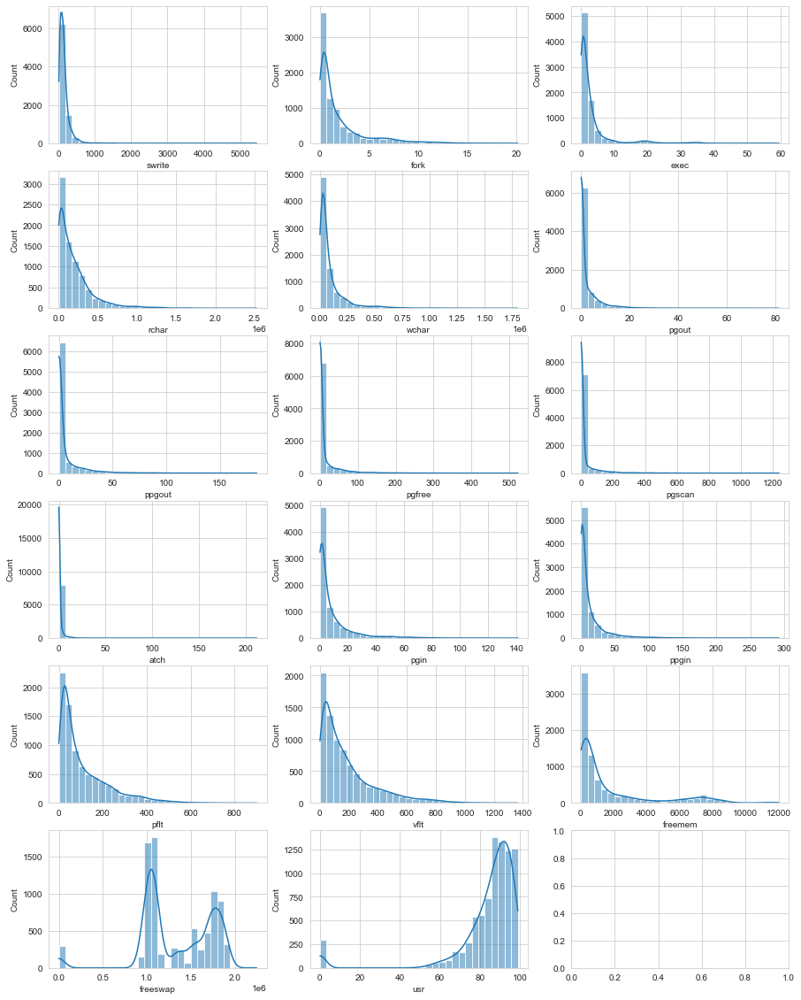

In [1606]:
fig, axes=plt.subplots(nrows=6,ncols=3)
fig.set_size_inches(15,20)
sns.histplot(df.swrite,bins=30,kde=True,ax=axes[0][0])
sns.histplot(df.fork,bins=30,kde=True,ax=axes[0][1])
sns.histplot(df.exec,bins=30,kde=True,ax=axes[0][2])
sns.histplot(df.rchar,bins=30,kde=True,ax=axes[1][0])
sns.histplot(df.wchar,bins=30,kde=True,ax=axes[1][1])
sns.histplot(df.pgout,bins=30,kde=True,ax=axes[1][2])
sns.histplot(df.ppgout,bins=30,kde=True,ax=axes[2][0])
sns.histplot(df.pgfree,bins=30,kde=True,ax=axes[2][1])
sns.histplot(df.pgscan,bins=30,kde=True,ax=axes[2][2])
sns.histplot(df.atch,bins=30,kde=True,ax=axes[3][0])
sns.histplot(df.pgin,bins=30,kde=True,ax=axes[3][1])
sns.histplot(df.ppgin,bins=30,kde=True,ax=axes[3][2])
sns.histplot(df.pflt,bins=30,kde=True,ax=axes[4][0])
sns.histplot(df.vflt,bins=30,kde=True,ax=axes[4][1])
sns.histplot(df.freemem,bins=30,kde=True,ax=axes[4][2])
sns.histplot(df.freeswap,bins=30,kde=True,ax=axes[5][0])
sns.histplot(df.usr,bins=30,kde=True,ax=axes[5][1])
plt.show()

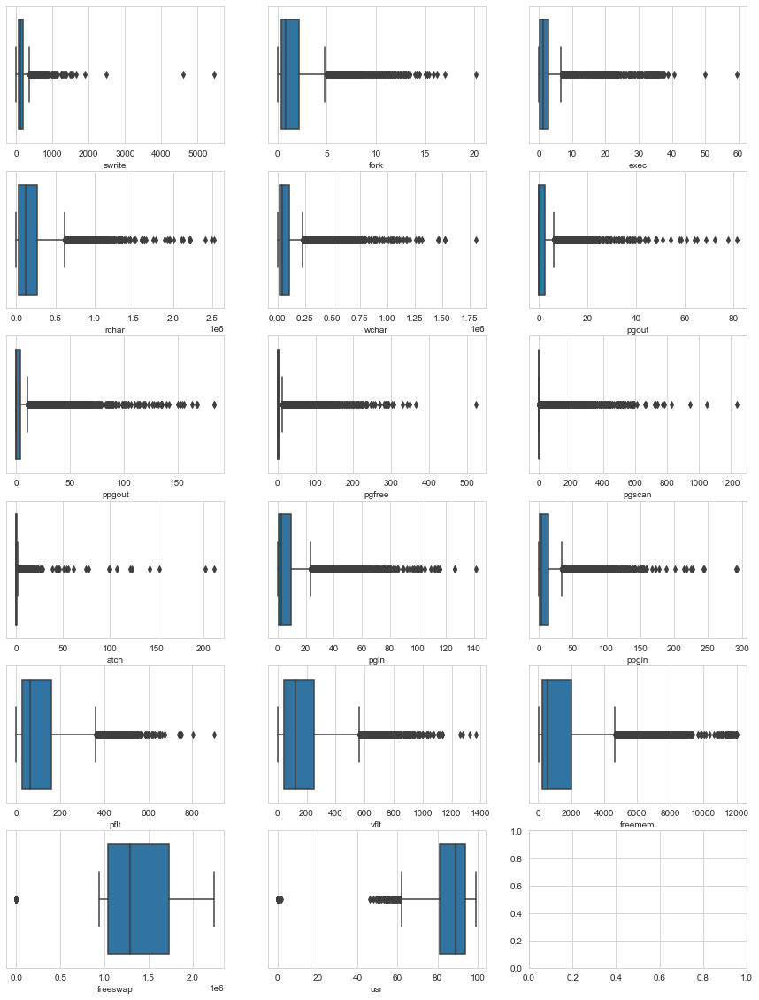

In [1607]:
fig, axes=plt.subplots(nrows=6,ncols=3)
fig.set_size_inches(15,20)
sns.boxplot(data=df,x=df.swrite,ax=axes[0][0])
sns.boxplot(data=df,x=df.fork,ax=axes[0][1])
sns.boxplot(data=df,x=df.exec,ax=axes[0][2])
sns.boxplot(data=df,x=df.rchar,ax=axes[1][0])
sns.boxplot(data=df,x=df.wchar,ax=axes[1][1])
sns.boxplot(data=df,x=df.pgout,ax=axes[1][2])
sns.boxplot(data=df,x=df.ppgout,ax=axes[2][0])
sns.boxplot(data=df,x=df.pgfree,ax=axes[2][1])
sns.boxplot(data=df,x=df.pgscan,ax=axes[2][2])
sns.boxplot(data=df,x=df.atch,ax=axes[3][0])
sns.boxplot(data=df,x=df.pgin,ax=axes[3][1])
sns.boxplot(data=df,x=df.ppgin,ax=axes[3][2])
sns.boxplot(data=df,x=df.pflt,ax=axes[4][0])
sns.boxplot(data=df,x=df.vflt,ax=axes[4][1])
sns.boxplot(data=df,x=df.freemem,ax=axes[4][2])
sns.boxplot(data=df,x=df.freeswap,ax=axes[5][0])
sns.boxplot(data=df,x=df.usr,ax=axes[5][1])
plt.show()

<AxesSubplot:xlabel='runqsz', ylabel='count'>

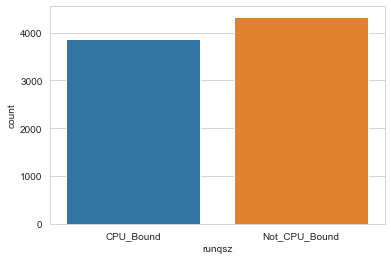

In [1608]:
sns.countplot(data=df,x=df.runqsz)

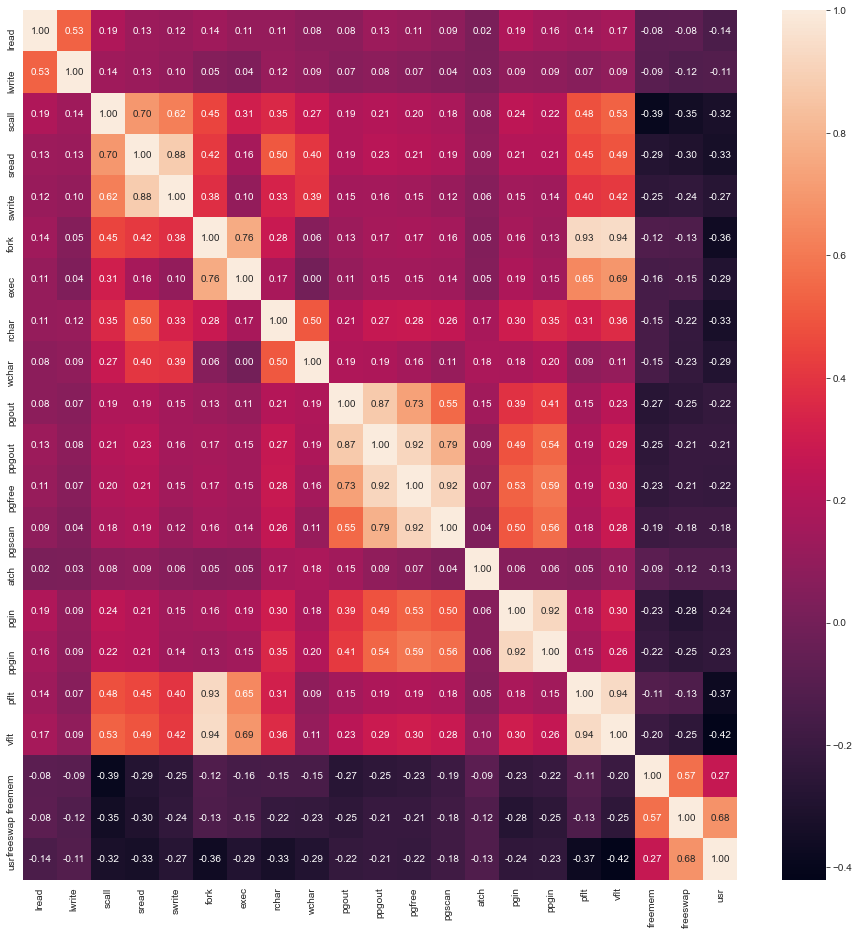

In [1609]:
plt.figure(figsize=(16,16))
sns.heatmap(df.corr(),annot=True,fmt=".2f");

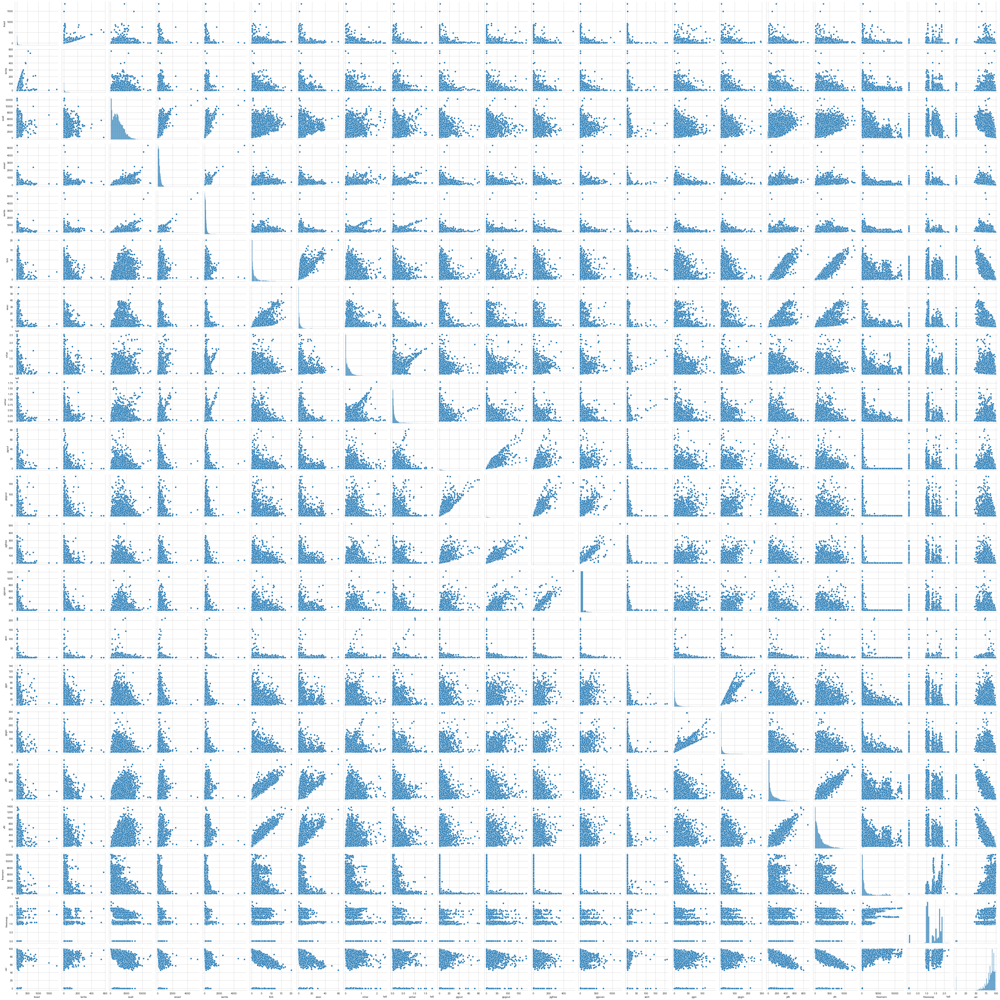

In [1610]:
sns.pairplot(df)

<AxesSubplot:xlabel='runqsz', ylabel='usr'>

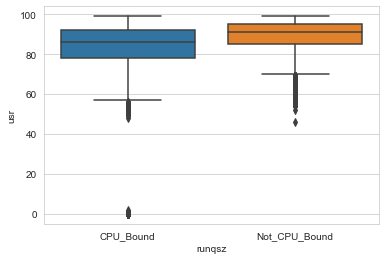

In [1611]:
sns.boxplot(data=df,x='runqsz',y='usr')

1.2 Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.

In [1612]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [1613]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [1614]:
df[['rchar', 'wchar']] = df[['rchar', 'wchar']].fillna(df[['rchar', 'wchar']].median())

In [1615]:
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [1616]:
df[df['pgin'] == 0]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
5,0,0,1201,65,61,0.4,0.40,125473.5,58703.0,0.0,...,0.0,0.0,0.0,0.0,28.40,34.40,Not_CPU_Bound,6854,1877461,96
9,0,0,188,13,24,0.2,0.20,125473.5,6777.0,0.0,...,0.0,0.0,0.0,0.0,15.60,16.80,Not_CPU_Bound,5310,1859912,98
19,18,23,192,14,33,0.2,0.20,125473.5,14377.0,0.0,...,0.0,0.0,0.0,0.0,15.40,16.80,Not_CPU_Bound,5274,1858256,98
20,1,1,369,166,52,0.2,0.20,125473.5,281166.0,0.0,...,0.0,0.0,0.0,0.0,15.60,17.00,CPU_Bound,5463,1828022,96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8142,0,0,157,10,9,0.2,0.20,424.0,1668.0,0.0,...,0.0,0.0,0.0,0.0,15.60,16.80,Not_CPU_Bound,6637,1873374,99
8163,10,3,5341,231,153,1.8,3.19,165609.0,51312.0,0.0,...,0.0,0.0,0.0,0.0,117.76,133.53,CPU_Bound,985,1628203,84
8167,0,0,3227,387,186,0.2,0.20,111564.0,46429.0,0.4,...,0.0,0.8,0.0,0.0,16.80,54.80,Not_CPU_Bound,303,1110995,90
8179,4,1,1062,141,126,2.8,1.20,74472.0,6098.0,0.0,...,0.0,0.0,0.0,0.0,161.80,211.20,Not_CPU_Bound,7349,1864162,93


In [1617]:
df[df['ppgin'] == 0]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
5,0,0,1201,65,61,0.4,0.40,125473.5,58703.0,0.0,...,0.0,0.0,0.0,0.0,28.40,34.40,Not_CPU_Bound,6854,1877461,96
9,0,0,188,13,24,0.2,0.20,125473.5,6777.0,0.0,...,0.0,0.0,0.0,0.0,15.60,16.80,Not_CPU_Bound,5310,1859912,98
19,18,23,192,14,33,0.2,0.20,125473.5,14377.0,0.0,...,0.0,0.0,0.0,0.0,15.40,16.80,Not_CPU_Bound,5274,1858256,98
20,1,1,369,166,52,0.2,0.20,125473.5,281166.0,0.0,...,0.0,0.0,0.0,0.0,15.60,17.00,CPU_Bound,5463,1828022,96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8142,0,0,157,10,9,0.2,0.20,424.0,1668.0,0.0,...,0.0,0.0,0.0,0.0,15.60,16.80,Not_CPU_Bound,6637,1873374,99
8163,10,3,5341,231,153,1.8,3.19,165609.0,51312.0,0.0,...,0.0,0.0,0.0,0.0,117.76,133.53,CPU_Bound,985,1628203,84
8167,0,0,3227,387,186,0.2,0.20,111564.0,46429.0,0.4,...,0.0,0.8,0.0,0.0,16.80,54.80,Not_CPU_Bound,303,1110995,90
8179,4,1,1062,141,126,2.8,1.20,74472.0,6098.0,0.0,...,0.0,0.0,0.0,0.0,161.80,211.20,Not_CPU_Bound,7349,1864162,93


In [1618]:
df[df['pflt'] == 0]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
1840,0,0,109,10,13,0.0,0.0,278.0,7934.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.2,Not_CPU_Bound,8493,1866040,99
5383,0,0,579,63,39,0.0,0.0,1601.0,17342.0,1.4,...,0.0,0.0,0.2,0.2,0.0,0.6,Not_CPU_Bound,240,1755790,91
5926,1,1,142,13,23,0.0,0.0,10150.0,5921.0,0.0,...,0.0,0.0,0.2,0.2,0.0,0.4,Not_CPU_Bound,7228,1847216,98


In [1619]:
df[df['usr'] == 0]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
7,21,18,2799,291,211,0.60,0.40,125473.5,259868.0,2.60,...,0.0,0.00,1.00,1.00,35.40,71.00,CPU_Bound,87,13,0
32,6,1,2414,249,163,1.20,3.60,125473.5,472149.0,2.00,...,0.8,0.80,11.00,15.80,61.00,133.40,CPU_Bound,89,10,0
51,50,65,2292,357,201,0.40,1.80,125473.5,75166.0,5.80,...,15.4,1.40,5.40,8.00,33.80,87.00,CPU_Bound,88,12,0
56,13,12,2527,254,144,0.20,0.20,125473.5,485338.0,0.00,...,0.0,107.58,25.95,26.15,37.72,238.12,CPU_Bound,81,19,0
63,7,2,2404,211,153,1.40,2.61,125473.5,43705.0,0.40,...,0.0,0.00,5.01,7.41,76.95,129.86,CPU_Bound,89,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8017,3,1,1833,659,317,0.20,0.20,735962.0,516358.0,7.60,...,30.4,3.00,11.00,16.00,27.60,62.20,CPU_Bound,89,11,0
8084,73,83,4405,540,461,8.42,2.40,272948.0,43129.0,6.41,...,0.0,1.40,6.21,11.22,405.81,612.22,CPU_Bound,68,32,0
8086,60,78,862,387,131,0.20,0.20,626392.0,639838.0,1.20,...,0.0,0.00,0.00,0.00,15.60,34.40,CPU_Bound,94,6,0
8148,19,16,1806,406,226,0.60,0.40,641052.0,533824.0,0.00,...,0.0,0.00,22.00,32.00,37.40,79.00,CPU_Bound,91,9,0


In [1620]:
df[df['pgout'] == 0]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8178,5,4,825,165,129,0.2,0.20,83366.0,53619.0,0.0,...,0.0,0.0,2.6,3.0,19.60,56.20,CPU_Bound,93,7,0
8179,4,1,1062,141,126,2.8,1.20,74472.0,6098.0,0.0,...,0.0,0.0,0.0,0.0,161.80,211.20,Not_CPU_Bound,7349,1864162,93
8181,9,1,1799,127,87,1.8,4.19,104229.0,37594.0,0.0,...,0.0,0.0,0.6,0.8,120.16,164.87,CPU_Bound,808,1529517,92
8183,4,3,1509,501,139,0.6,1.00,312242.0,255308.0,0.0,...,0.0,0.0,3.2,3.2,52.60,119.60,CPU_Bound,1051,1600333,92


In [1621]:
df[df['ppgout'] == 0]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8178,5,4,825,165,129,0.2,0.20,83366.0,53619.0,0.0,...,0.0,0.0,2.6,3.0,19.60,56.20,CPU_Bound,93,7,0
8179,4,1,1062,141,126,2.8,1.20,74472.0,6098.0,0.0,...,0.0,0.0,0.0,0.0,161.80,211.20,Not_CPU_Bound,7349,1864162,93
8181,9,1,1799,127,87,1.8,4.19,104229.0,37594.0,0.0,...,0.0,0.0,0.6,0.8,120.16,164.87,CPU_Bound,808,1529517,92
8183,4,3,1509,501,139,0.6,1.00,312242.0,255308.0,0.0,...,0.0,0.0,3.2,3.2,52.60,119.60,CPU_Bound,1051,1600333,92


In [1622]:
df[df['pgfree'] == 0]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8178,5,4,825,165,129,0.2,0.20,83366.0,53619.0,0.0,...,0.0,0.0,2.6,3.0,19.60,56.20,CPU_Bound,93,7,0
8179,4,1,1062,141,126,2.8,1.20,74472.0,6098.0,0.0,...,0.0,0.0,0.0,0.0,161.80,211.20,Not_CPU_Bound,7349,1864162,93
8181,9,1,1799,127,87,1.8,4.19,104229.0,37594.0,0.0,...,0.0,0.0,0.6,0.8,120.16,164.87,CPU_Bound,808,1529517,92
8183,4,3,1509,501,139,0.6,1.00,312242.0,255308.0,0.0,...,0.0,0.0,3.2,3.2,52.60,119.60,CPU_Bound,1051,1600333,92


In [1623]:
df[df['ppgout'] == 0]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8178,5,4,825,165,129,0.2,0.20,83366.0,53619.0,0.0,...,0.0,0.0,2.6,3.0,19.60,56.20,CPU_Bound,93,7,0
8179,4,1,1062,141,126,2.8,1.20,74472.0,6098.0,0.0,...,0.0,0.0,0.0,0.0,161.80,211.20,Not_CPU_Bound,7349,1864162,93
8181,9,1,1799,127,87,1.8,4.19,104229.0,37594.0,0.0,...,0.0,0.0,0.6,0.8,120.16,164.87,CPU_Bound,808,1529517,92
8183,4,3,1509,501,139,0.6,1.00,312242.0,255308.0,0.0,...,0.0,0.0,3.2,3.2,52.60,119.60,CPU_Bound,1051,1600333,92


In [1624]:
df['lread'] = df['lread'].replace(0,df['lread'].median())
df['lwrite'] = df['lwrite'].replace(0,df['lwrite'].median())

In [1625]:
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [1626]:
df[df.usr == 0]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
7,21,18,2799,291,211,0.60,0.40,125473.5,259868.0,2.60,...,0.0,0.00,1.00,1.00,35.40,71.00,CPU_Bound,87,13,0
32,6,1,2414,249,163,1.20,3.60,125473.5,472149.0,2.00,...,0.8,0.80,11.00,15.80,61.00,133.40,CPU_Bound,89,10,0
51,50,65,2292,357,201,0.40,1.80,125473.5,75166.0,5.80,...,15.4,1.40,5.40,8.00,33.80,87.00,CPU_Bound,88,12,0
56,13,12,2527,254,144,0.20,0.20,125473.5,485338.0,0.00,...,0.0,107.58,25.95,26.15,37.72,238.12,CPU_Bound,81,19,0
63,7,2,2404,211,153,1.40,2.61,125473.5,43705.0,0.40,...,0.0,0.00,5.01,7.41,76.95,129.86,CPU_Bound,89,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8017,3,1,1833,659,317,0.20,0.20,735962.0,516358.0,7.60,...,30.4,3.00,11.00,16.00,27.60,62.20,CPU_Bound,89,11,0
8084,73,83,4405,540,461,8.42,2.40,272948.0,43129.0,6.41,...,0.0,1.40,6.21,11.22,405.81,612.22,CPU_Bound,68,32,0
8086,60,78,862,387,131,0.20,0.20,626392.0,639838.0,1.20,...,0.0,0.00,0.00,0.00,15.60,34.40,CPU_Bound,94,6,0
8148,19,16,1806,406,226,0.60,0.40,641052.0,533824.0,0.00,...,0.0,0.00,22.00,32.00,37.40,79.00,CPU_Bound,91,9,0


In [1627]:
df1 = df[df['usr'] > 0]

In [1628]:
df1['runqsz']=df1['runqsz'].astype('category')

<ipython-input-1628-bc07474127d6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['runqsz']=df1['runqsz'].astype('category')


In [1629]:
df1.runqsz = df1.runqsz.cat.codes

C:\Users\Renjith KP\anaconda3\lib\site-packages\pandas\core\generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [1630]:
import copy

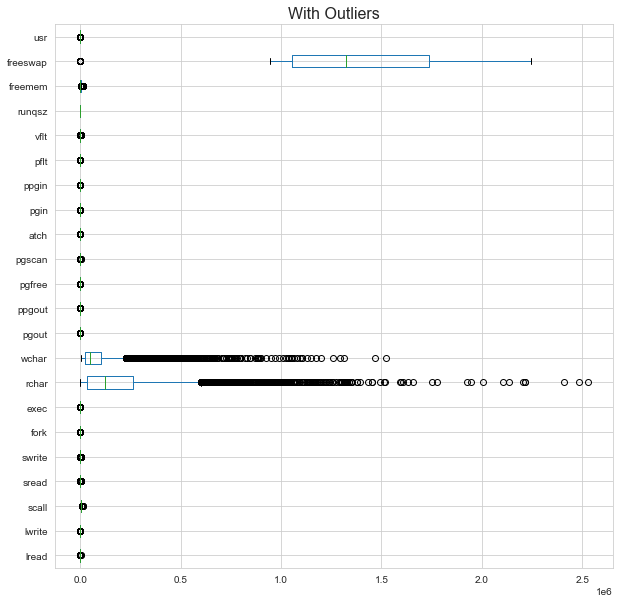

In [1631]:
# construct box plot for continuous variables
cont=df1.dtypes[(df1.dtypes!='uint8') & (df1.dtypes!='ufloat64') & (df1.dtypes!='uint64') ].index
plt.figure(figsize=(10,10))
df1[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

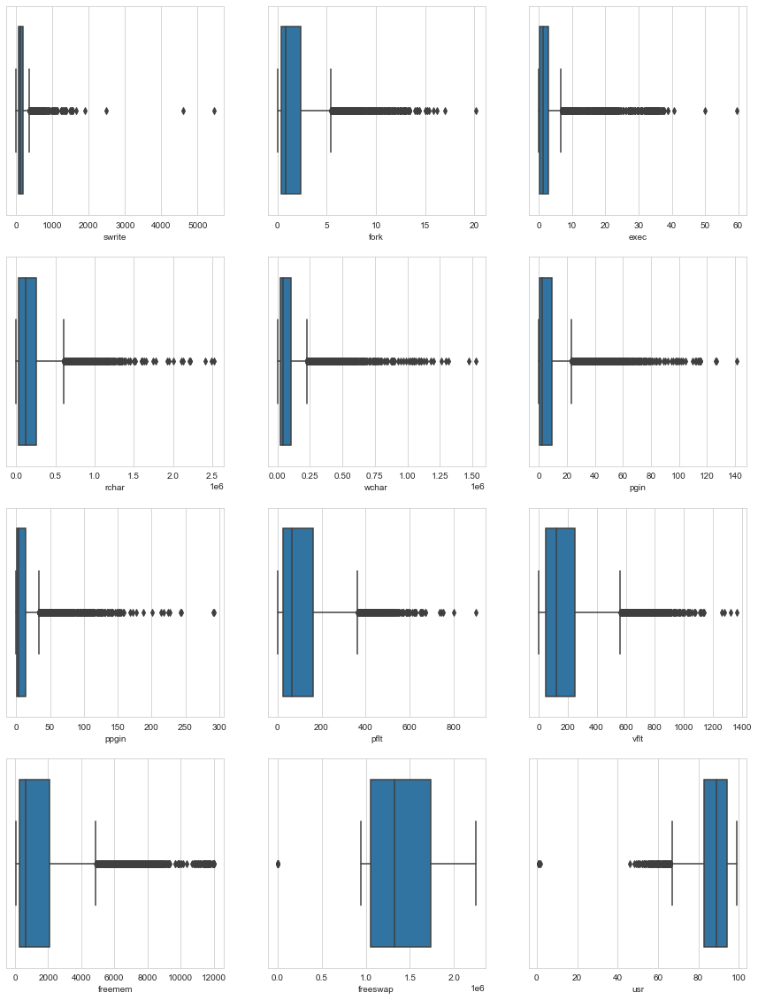

In [1632]:
fig, axes=plt.subplots(nrows=4,ncols=3)
fig.set_size_inches(15,20)
sns.boxplot(data=df1,x=df1.swrite,ax=axes[0][0])
sns.boxplot(data=df1,x=df1.fork,ax=axes[0][1])
sns.boxplot(data=df1,x=df1.exec,ax=axes[0][2])
sns.boxplot(data=df1,x=df1.rchar,ax=axes[1][0])
sns.boxplot(data=df1,x=df1.wchar,ax=axes[1][1])
sns.boxplot(data=df1,x=df1.pgin,ax=axes[1][2])
sns.boxplot(data=df1,x=df1.ppgin,ax=axes[2][0])
sns.boxplot(data=df1,x=df1.pflt,ax=axes[2][1])
sns.boxplot(data=df1,x=df1.vflt,ax=axes[2][2])
sns.boxplot(data=df1,x=df1.freemem,ax=axes[3][0])
sns.boxplot(data=df1,x=df1.freeswap,ax=axes[3][1])
sns.boxplot(data=df1,x=df1.usr,ax=axes[3][2])
plt.show()

In [1633]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [1634]:
df_outlier_treated = copy.deepcopy(df1)

In [1635]:
for column in df_outlier_treated[cont].columns:
    lr,ur=remove_outlier(df_outlier_treated[column])
    df_outlier_treated[column]=np.where(df_outlier_treated[column]>ur,ur,df_outlier_treated[column])
    df_outlier_treated[column]=np.where(df_outlier_treated[column]<lr,lr,df_outlier_treated[column])

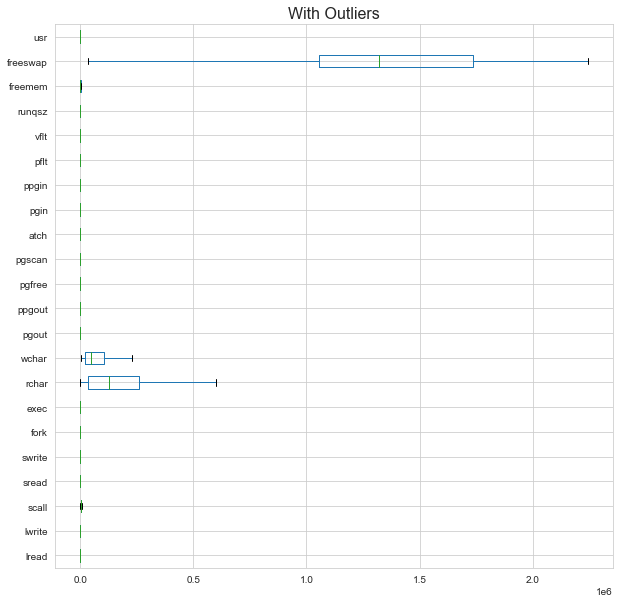

In [1636]:
# construct box plot for continuous variables
cont=df_outlier_treated.dtypes[(df_outlier_treated.dtypes!='uint8') & (df_outlier_treated.dtypes!='ufloat64') & (df_outlier_treated.dtypes!='uint64') ].index
plt.figure(figsize=(10,10))
df_outlier_treated[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

df_without_drop : data fram without droping ‘pgout’,’pgfree’ ,’pgscan’ and ‘atch’ 

In [1637]:
df_without_drop_outlier_treated =copy.deepcopy(df_outlier_treated)

In [1638]:
df_without_drop =copy.deepcopy(df1)

In [1639]:
df_with_drop_outlier_treated=copy.deepcopy(df_outlier_treated)

In [1640]:
df_with_drop = copy.deepcopy(df1)

In [1641]:
df_with_drop.drop(['pgout','pgfree','ppgout','pgscan','atch'],axis=1,inplace=True)

In [1642]:
df_with_drop_outlier_treated.drop(['pgout','pgfree','ppgout','pgscan','atch'],axis=1,inplace=True)

1.3	Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning. -18

Model1 : After droping 'pgout','pgfree','ppgout','pgscan','atch', without treating outliers regression model is developed and VIF is not checked and corrected

In [1643]:
X1=df_with_drop.drop('usr',axis=1)
y1=df_with_drop[['usr']]

In [1644]:
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.3 , random_state=1)

In [1645]:
model1 = LinearRegression()
model1.fit(X_train, y_train)

LinearRegression()

In [1646]:
# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, model1.coef_[0][idx]))

The coefficient for lread is -0.012517571790030393
The coefficient for lwrite is -0.001022625848688858
The coefficient for scall is -0.0012069676566947892
The coefficient for sread is -6.285730663147527e-05
The coefficient for swrite is -0.002674655986710154
The coefficient for fork is -0.1785452833342542
The coefficient for exec is -0.2622663199600701
The coefficient for rchar is -2.0230121069931428e-06
The coefficient for wchar is -6.890190674857288e-06
The coefficient for pgin is -0.01417699482397162
The coefficient for ppgin is -0.04532467365614972
The coefficient for pflt is -0.01817104084241648
The coefficient for vflt is -0.01150923862773628
The coefficient for runqsz is 0.4178986410055293
The coefficient for freemem is 5.946326120021336e-05
The coefficient for freeswap is 2.133656721443786e-06


In [1647]:
# Let us check the intercept for the model

intercept = model1.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 94.03655181625234


In [1648]:
# R square on training data
model1.score(X_train, y_train)

0.8047403235798777

In [1649]:
# R square on testing data
model1.score(X_test, y_test)

0.8558017694378464

In [1650]:
#RMSE on Training data
predicted_train=model1.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

4.217810504614996

In [1651]:
#RMSE on Testing data
predicted_test=model1.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

3.5083635075552158

Model2 : Model 1 with statsmodel 

In [1652]:
import statsmodels.api as sm

In [1653]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [1654]:
model2 = sm.OLS(y_train,X_train).fit()
model2

In [1655]:
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.805
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     1422.
Date:                Sun, 08 Jan 2023   Prob (F-statistic):               0.00
Time:                        10:03:37   Log-Likelihood:                -15823.
No. Observations:                5536   AIC:                         3.168e+04
Df Residuals:                    5519   BIC:                         3.179e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         94.0366      0.395    237.767      0.000      93.261      94.812
lread         -0.0125      0.001    -10.308      0.000      -0.015      -0.010
lwrite        -0.0010      0.002     -0.465      0.642      -0.005       0.003
scall         -0.0012   5.59e-05    -21.589      0.000      -0.001      -0.001
sread      -6.286e-05      0.001     -0.081      0.936      -0.002       0.001
swrite        -0.0027      0.001     -3.154      0.002      -0.004      -0.001
fork          -0.1785      0.095     -1.872      0.061      -0.366       0.008
exec          -0.2623      0.019    -14.077      0.000      -0.299      -0.226
rchar      -2.023e-06    3.4e-07     -5.950      0.000   -2.69e-06   -1.36e-06
wchar       -6.89e-06   5.32e-07    -12.958      0.000   -7.93e-06   -5.85e-06
pgin          -0.0142      0.011     -1.236      0.216      -0.037       0.008
ppgin         -0.0453      0.007     -6.338      0.000      -0.059      -0.031
pflt          -0.0182      0.002    -11.052      0.000      -0.021      -0.015
vflt          -0.0115      0.001     -9.225      0.000      -0.014      -0.009
runqsz         0.4179      0.124      3.358      0.001       0.174       0.662
freemem     5.946e-05      3e-05      1.983      0.047     6.7e-07       0.000
freeswap    2.134e-06   2.42e-07      8.806      0.000    1.66e-06    2.61e-06
==============================================================================
Omnibus:                     9217.767   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          9733972.678
Skew:                         -11.067   Prob(JB):                         0.00
Kurtosis:                     207.229   Cond. No.                     1.01e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.01e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1656]:
olsmod_1=sm.OLS(y_train,X_train)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.805 
Adjusted R-Squared: 0.804


In [1657]:
olsmod_1=sm.OLS(y_test,X_test)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.861 
Adjusted R-Squared: 0.86


In [1658]:
#Calculate MSE on train
predicted_train=model2.predict(X_train)
mse=metrics.mean_squared_error(y_train,predicted_train)


In [1659]:
np.sqrt(mse) #RMSE on train 


4.217810504614996

In [1660]:
# Prediction on Test data
y_pred = model2.predict(X_test)
#Calculate MSE on test
mse=metrics.mean_squared_error(y_test,y_pred)
np.sqrt(mse) #RMSE on test

3.5083635075552664

Model 3 : Withou droping 'pgout','pgfree','ppgout','pgscan','atch', without treating outliers regression model is developed and VIF is not checked and corrected

In [1661]:
X3=df_without_drop.drop('usr',axis=1)
y3=df_without_drop[['usr']]

In [1662]:
X_train, X_test, y_train, y_test = train_test_split(X3, y3, test_size=0.3 , random_state=1)

In [1663]:
model3 = LinearRegression()
model3.fit(X_train, y_train)

LinearRegression()

In [1664]:
# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, model3.coef_[0][idx]))

The coefficient for lread is -0.012715097592600184
The coefficient for lwrite is -0.0008216874955240515
The coefficient for scall is -0.0012073821404600944
The coefficient for sread is -0.00018846564368757147
The coefficient for swrite is -0.0025444946252549633
The coefficient for fork is -0.23576011811481662
The coefficient for exec is -0.26451680507532943
The coefficient for rchar is -2.1591834996652817e-06
The coefficient for wchar is -6.6221394410048085e-06
The coefficient for pgout is -0.10718135123468342
The coefficient for ppgout is 0.0283669843634248
The coefficient for pgfree is -0.014883562607237425
The coefficient for pgscan is 0.0030764283793791
The coefficient for atch is 0.017901593173958324
The coefficient for pgin is -0.014370248756516
The coefficient for ppgin is -0.04012276030392659
The coefficient for pflt is -0.01812402464468903
The coefficient for vflt is -0.010521154546725515
The coefficient for runqsz is 0.47438208407842974
The coefficient for freemem is 3.006343

In [1665]:
# Let us check the intercept for the model

intercept = model3.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is 94.04375895066408


In [1666]:
# R square on training data
model3.score(X_train, y_train)

0.8063768516132183

In [1667]:
# R square on testing data
model3.score(X_test, y_test)

0.8574709865749798

In [1668]:
#RMSE on Training data
predicted_train=model3.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

4.200097965890714

In [1669]:
#RMSE on Testing data
predicted_test=model3.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

3.4879982542590677

Model4 : Model 3 with statsmodel 

In [1670]:
import statsmodels.api as sm

In [1671]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [1672]:
model4 = sm.OLS(y_train,X_train).fit()
model4

In [1673]:
model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     1094.
Date:                Sun, 08 Jan 2023   Prob (F-statistic):               0.00
Time:                        10:03:37   Log-Likelihood:                -15800.
No. Observations:                5536   AIC:                         3.164e+04
Df Residuals:                    5514   BIC:                         3.179e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         94.0438      0.397    237.121      0.000      93.266      94.821
lread         -0.0127      0.001    -10.443      0.000      -0.015      -0.010
lwrite        -0.0008      0.002     -0.375      0.708      -0.005       0.003
scall         -0.0012   5.58e-05    -21.649      0.000      -0.001      -0.001
sread         -0.0002      0.001     -0.242      0.809      -0.002       0.001
swrite        -0.0025      0.001     -3.002      0.003      -0.004      -0.001
fork          -0.2358      0.097     -2.440      0.015      -0.425      -0.046
exec          -0.2645      0.019    -14.231      0.000      -0.301      -0.228
rchar      -2.159e-06   3.41e-07     -6.335      0.000   -2.83e-06   -1.49e-06
wchar      -6.622e-06    5.4e-07    -12.275      0.000   -7.68e-06   -5.56e-06
pgout         -0.1072      0.025     -4.304      0.000      -0.156      -0.058
ppgout         0.0284      0.015      1.948      0.051      -0.000       0.057
pgfree        -0.0149      0.007     -2.055      0.040      -0.029      -0.001
pgscan         0.0031      0.002      1.540      0.124      -0.001       0.007
atch           0.0179      0.011      1.637      0.102      -0.004       0.039
pgin          -0.0144      0.012     -1.237      0.216      -0.037       0.008
ppgin         -0.0401      0.008     -5.233      0.000      -0.055      -0.025
pflt          -0.0181      0.002    -10.996      0.000      -0.021      -0.015
vflt          -0.0105      0.001     -8.078      0.000      -0.013      -0.008
runqsz         0.4744      0.124      3.816      0.000       0.231       0.718
freemem     3.006e-05   3.02e-05      0.994      0.320   -2.92e-05    8.94e-05
freeswap    2.169e-06   2.43e-07      8.943      0.000    1.69e-06    2.64e-06
==============================================================================
Omnibus:                     9304.052   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         10222053.280
Skew:                         -11.278   Prob(JB):                         0.00
Kurtosis:                     212.300   Cond. No.                     1.01e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.01e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1674]:
olsmod_1=sm.OLS(y_train,X_train)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.806 
Adjusted R-Squared: 0.806


In [1675]:
olsmod_1=sm.OLS(y_test,X_test)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.863 
Adjusted R-Squared: 0.862


In [1676]:
#Calculate MSE on train
predicted_train=model4.predict(X_train)
mse=metrics.mean_squared_error(y_train,predicted_train)


np.sqrt(mse) #RMSE on train 



4.200097965890714

In [1677]:

# Prediction on Test data
y_pred = model4.predict(X_test)
#Calculate MSE on test
mse=metrics.mean_squared_error(y_test,y_pred)
np.sqrt(mse) #RMSE on test

3.48799825425917

In [1678]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const       49.166198
lread        1.445126
lwrite       1.389444
scall        2.591931
sread        7.854090
swrite       6.286399
fork        18.552454
exec         3.134549
rchar        1.853783
wchar        1.468538
pgout        5.150900
ppgout      15.090305
pgfree      16.699067
pgscan       6.605920
atch         1.098563
pgin         7.922237
ppgin        8.565302
pflt        11.299482
vflt        19.761906
runqsz       1.194956
freemem      1.837629
freeswap     2.201713
dtype: float64



In [1679]:
X_train2 = X_train.drop(['vflt'],axis=1)
olsmod_1=sm.OLS(y_train,X_train2)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.804 
Adjusted R-Squared: 0.803


Now lets discuss only about dataset after droping 'pgout','pgfree','ppgout','pgscan','atch'
Model 5 : After treating outliers regression model is created

In [1680]:
X5=df_with_drop_outlier_treated.drop('usr',axis=1)
y5=df_with_drop_outlier_treated[['usr']]

In [1681]:
X_train, X_test, y_train, y_test = train_test_split(X5, y5, test_size=0.3 , random_state=1)

In [1682]:
model5 = LinearRegression()
model5.fit(X_train, y_train)

LinearRegression()

In [1683]:
# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, model5.coef_[0][idx]))

The coefficient for lread is -0.05388174555244543
The coefficient for lwrite is 0.039775837363570654
The coefficient for scall is -0.0013180511307128138
The coefficient for sread is -0.00019016432849758945
The coefficient for swrite is -0.00538389563081009
The coefficient for fork is -0.12793528398987986
The coefficient for exec is -0.36055634831916605
The coefficient for rchar is -3.0194455540984635e-06
The coefficient for wchar is -6.919201998882703e-06
The coefficient for pgin is -0.04492485757033674
The coefficient for ppgin is -0.0704348973803017
The coefficient for pflt is -0.01996986427412779
The coefficient for vflt is -0.012401306255803162
The coefficient for runqsz is -0.49570222700510963
The coefficient for freemem is 0.00034432734040669205
The coefficient for freeswap is -6.070204218351645e-07


In [1684]:

# Let us check the intercept for the model

intercept = model5.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is 99.26882701507905


In [1685]:

# R square on training data
model5.score(X_train, y_train)

0.8854549786659583

In [1686]:
# R square on testing data
model5.score(X_test, y_test)


0.8799499724901937

In [1687]:
#RMSE on Training data
predicted_train=model5.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

2.8255534747442237

In [1688]:

#RMSE on Testing data
predicted_test=model5.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

2.871850614899973


Model4 : Model 3 with statsmodel 

In [1689]:
import statsmodels.api as sm

X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [1690]:
model6 = sm.OLS(y_train,X_train).fit()
model6

In [1691]:
model6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.885
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                     2666.
Date:                Sun, 08 Jan 2023   Prob (F-statistic):               0.00
Time:                        10:03:38   Log-Likelihood:                -13606.
No. Observations:                5536   AIC:                         2.725e+04
Df Residuals:                    5519   BIC:                         2.736e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         99.2688      0.272    364.463      0.000      98.735      99.803
lread         -0.0539      0.006     -9.148      0.000      -0.065      -0.042
lwrite         0.0398      0.009      4.586      0.000       0.023       0.057
scall         -0.0013   4.21e-05    -31.312      0.000      -0.001      -0.001
sread         -0.0002      0.001     -0.277      0.782      -0.002       0.001
swrite        -0.0054      0.001     -5.602      0.000      -0.007      -0.003
fork          -0.1279      0.082     -1.567      0.117      -0.288       0.032
exec          -0.3606      0.033    -10.985      0.000      -0.425      -0.296
rchar      -3.019e-06   3.21e-07     -9.405      0.000   -3.65e-06   -2.39e-06
wchar      -6.919e-06    6.9e-07    -10.024      0.000   -8.27e-06   -5.57e-06
pgin          -0.0449      0.019     -2.378      0.017      -0.082      -0.008
ppgin         -0.0704      0.013     -5.458      0.000      -0.096      -0.045
pflt          -0.0200      0.001    -15.783      0.000      -0.022      -0.017
vflt          -0.0124      0.001    -13.314      0.000      -0.014      -0.011
runqsz        -0.4957      0.084     -5.914      0.000      -0.660      -0.331
freemem        0.0003   3.07e-05     11.205      0.000       0.000       0.000
freeswap    -6.07e-07   1.66e-07     -3.647      0.000   -9.33e-07   -2.81e-07
==============================================================================
Omnibus:                     1255.024   Durbin-Watson:                   2.028
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4761.149
Skew:                          -1.088   Prob(JB):                         0.00
Kurtosis:                       6.989   Cond. No.                     1.03e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.03e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1692]:
olsmod_1=sm.OLS(y_train,X_train)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.885 
Adjusted R-Squared: 0.885


In [1693]:

olsmod_1=sm.OLS(y_test,X_test)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.882 
Adjusted R-Squared: 0.881


In [1694]:
#Calculate MSE on train
predicted_train=model6.predict(X_train)
mse=metrics.mean_squared_error(y_train,predicted_train)


np.sqrt(mse) #RMSE on train 

2.8255534747442237

In [1695]:
# Prediction on Test data
y_pred = model6.predict(X_test)
#Calculate MSE on test
mse=metrics.mean_squared_error(y_test,y_pred)
np.sqrt(mse) #RMSE on test

2.871850614900838

In [1696]:
for i,j in np.array(model6.params.reset_index()):
    print('({}) * {} +'.format(round(j,2),i),end=' ')

(99.27) * const + (-0.05) * lread + (0.04) * lwrite + (-0.0) * scall + (-0.0) * sread + (-0.01) * swrite + (-0.13) * fork + (-0.36) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.04) * pgin + (-0.07) * ppgin + (-0.02) * pflt + (-0.01) * vflt + (-0.5) * runqsz + (0.0) * freemem + (-0.0) * freeswap + 

In [1697]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const       51.282729
lread        4.648116
lwrite       3.878619
scall        3.124708
sread        6.925564
swrite       6.131479
fork        13.668159
exec         3.121266
rchar        1.996154
wchar        1.553213
pgin        14.286403
ppgin       14.114773
pflt        11.643730
vflt        16.096923
runqsz       1.201713
freemem      1.863069
freeswap     2.290922
dtype: float64



In [1698]:
X_train2 = X_train.drop(['vflt'],axis=1)
olsmod_1=sm.OLS(y_train,X_train2)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.882 
Adjusted R-Squared: 0.881


In [1699]:
X_train = X_train.drop(['vflt'],axis=1)

In [1700]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const       49.556142
lread        4.629373
lwrite       3.877331
scall        3.118724
sread        6.886711
swrite       6.128660
fork        10.194149
exec         3.117267
rchar        1.981167
wchar        1.541613
pgin        14.130733
ppgin       14.111994
pflt         9.165910
runqsz       1.201166
freemem      1.862432
freeswap     2.192928
dtype: float64



In [1701]:
X_train2 = X_train.drop(['pgin'],axis=1)
olsmod_1=sm.OLS(y_train,X_train2)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.881 
Adjusted R-Squared: 0.881


In [1702]:
X_train = X_train.drop(['pgin'],axis=1)

In [1703]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const       48.737944
lread        4.626917
lwrite       3.877143
scall        3.116887
sread        6.886406
swrite       6.128328
fork        10.187893
exec         3.112860
rchar        1.974602
wchar        1.541416
ppgin        1.454736
pflt         9.164700
runqsz       1.199925
freemem      1.861390
freeswap     2.161415
dtype: float64



In [1704]:
X_train2 = X_train.drop(['fork'],axis=1)
olsmod_1=sm.OLS(y_train,X_train2)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.88 
Adjusted R-Squared: 0.879


In [1705]:
X_train = X_train.drop(['fork'],axis=1)

In [1706]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const       48.567685
lread        4.594907
lwrite       3.841239
scall        3.055537
sread        6.880119
swrite       5.814086
exec         2.750238
rchar        1.973176
wchar        1.528919
ppgin        1.450211
pflt         3.380784
runqsz       1.199628
freemem      1.859748
freeswap     2.160918
dtype: float64



In [1707]:
X_train2 = X_train.drop(['sread'],axis=1)
olsmod_1=sm.OLS(y_train,X_train2)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.88 
Adjusted R-Squared: 0.879


In [1708]:
X_train = X_train.drop(['sread'],axis=1)

In [1709]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const       48.415054
lread        4.589144
lwrite       3.836408
scall        2.789850
swrite       3.027731
exec         2.746950
rchar        1.611105
wchar        1.508252
ppgin        1.450030
pflt         3.360200
runqsz       1.199626
freemem      1.859217
freeswap     2.146683
dtype: float64



Model 7

In [1710]:
X7=df_with_drop_outlier_treated.drop(['usr','vflt','pgin','fork','sread'],axis=1)
y7=df_with_drop_outlier_treated[['usr']]

In [1711]:
X_train, X_test, y_train, y_test = train_test_split(X7, y7, test_size=0.3 , random_state=1)

In [1712]:
model7 = LinearRegression()
model7.fit(X_train, y_train)

LinearRegression()

In [1713]:

# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, model7.coef_[0][idx]))

The coefficient for lread is -0.06288320198354586
The coefficient for lwrite is 0.049437581484573966
The coefficient for scall is -0.0013011193231742002
The coefficient for swrite is -0.007865746426032346
The coefficient for exec is -0.48819060536186404
The coefficient for rchar is -3.534515135217483e-06
The coefficient for wchar is -5.419406959553467e-06
The coefficient for ppgin is -0.11686418082312118
The coefficient for pflt is -0.03637961417944505
The coefficient for runqsz is -0.4745362204217856
The coefficient for freemem is 0.00032467028890344066
The coefficient for freeswap is -8.58380871610647e-08


In [1714]:

# Let us check the intercept for the model

intercept = model7.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is 98.61077580783623


In [1715]:
# R square on training data
model7.score(X_train, y_train)

0.8795122783257929

In [1716]:
# R square on testing data
model7.score(X_test, y_test)

0.8731029377854809

In [1717]:

#RMSE on Training data
predicted_train=model7.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

2.8979228437051523

In [1718]:

#RMSE on Testing data
predicted_test=model7.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

2.952612795184647

Model8 : Model 7 with statsmodel

In [1719]:
import statsmodels.api as sm

In [1720]:


X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [1721]:
model8 = sm.OLS(y_train,X_train).fit()
model8

In [1722]:
model8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.880
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     3360.
Date:                Sun, 08 Jan 2023   Prob (F-statistic):               0.00
Time:                        10:03:39   Log-Likelihood:                -13746.
No. Observations:                5536   AIC:                         2.752e+04
Df Residuals:                    5523   BIC:                         2.760e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         98.6108      0.271    363.442      0.000      98.079      99.143
lread         -0.0629      0.006    -10.480      0.000      -0.075      -0.051
lwrite         0.0494      0.009      5.591      0.000       0.032       0.067
scall         -0.0013   4.08e-05    -31.907      0.000      -0.001      -0.001
swrite        -0.0079      0.001    -11.360      0.000      -0.009      -0.007
exec          -0.4882      0.032    -15.464      0.000      -0.550      -0.426
rchar      -3.535e-06   2.96e-07    -11.953      0.000   -4.11e-06   -2.95e-06
wchar      -5.419e-06   6.97e-07     -7.771      0.000   -6.79e-06   -4.05e-06
ppgin         -0.1169      0.004    -27.558      0.000      -0.125      -0.109
pflt          -0.0364      0.001    -52.204      0.000      -0.038      -0.035
runqsz        -0.4745      0.086     -5.527      0.000      -0.643      -0.306
freemem        0.0003   3.15e-05     10.316      0.000       0.000       0.000
freeswap   -8.584e-08   1.65e-07     -0.520      0.603    -4.1e-07    2.38e-07
==============================================================================
Omnibus:                     1005.118   Durbin-Watson:                   2.043
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3357.608
Skew:                          -0.907   Prob(JB):                         0.00
Kurtosis:                       6.356   Cond. No.                     1.00e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  1e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1723]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const       48.415054
lread        4.589144
lwrite       3.836408
scall        2.789850
swrite       3.027731
exec         2.746950
rchar        1.611105
wchar        1.508252
ppgin        1.450030
pflt         3.360200
runqsz       1.199626
freemem      1.859217
freeswap     2.146683
dtype: float64



In [1724]:
X_train=X_train.drop(['freeswap'],axis=1)

In [1725]:
X_test=X_test.drop(['freeswap'],axis=1)

In [1726]:
model9 = sm.OLS(y_train,X_train).fit()
model9

In [1727]:
model9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.880
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     3666.
Date:                Sun, 08 Jan 2023   Prob (F-statistic):               0.00
Time:                        10:03:40   Log-Likelihood:                -13746.
No. Observations:                5536   AIC:                         2.752e+04
Df Residuals:                    5524   BIC:                         2.759e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         98.4848      0.122    808.269      0.000      98.246      98.724
lread         -0.0629      0.006    -10.483      0.000      -0.075      -0.051
lwrite         0.0496      0.009      5.612      0.000       0.032       0.067
scall         -0.0013   4.02e-05    -32.296      0.000      -0.001      -0.001
swrite        -0.0078      0.001    -11.353      0.000      -0.009      -0.006
exec          -0.4872      0.032    -15.461      0.000      -0.549      -0.425
rchar      -3.533e-06   2.96e-07    -11.948      0.000   -4.11e-06   -2.95e-06
wchar      -5.428e-06   6.97e-07     -7.787      0.000    -6.8e-06   -4.06e-06
ppgin         -0.1164      0.004    -28.017      0.000      -0.125      -0.108
pflt          -0.0364      0.001    -52.391      0.000      -0.038      -0.035
runqsz        -0.4634      0.083     -5.575      0.000      -0.626      -0.300
freemem        0.0003   2.63e-05     12.011      0.000       0.000       0.000
==============================================================================
Omnibus:                      999.129   Durbin-Watson:                   2.043
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3295.821
Skew:                          -0.906   Prob(JB):                         0.00
Kurtosis:                       6.317   Cond. No.                     8.58e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.58e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1728]:
olsmod_1=sm.OLS(y_train,X_train)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.88 
Adjusted R-Squared: 0.879


In [1729]:
olsmod_1=sm.OLS(y_test,X_test)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.874 
Adjusted R-Squared: 0.874


In [1730]:
#Calculate MSE on train
predicted_train=model9.predict(X_train)
mse=metrics.mean_squared_error(y_train,predicted_train)
np.sqrt(mse) #RMSE on train 

2.897993679949003

In [1731]:
# Prediction on Test data
y_pred = model9.predict(X_test)
#Calculate MSE on test
mse=metrics.mean_squared_error(y_test,y_pred)
np.sqrt(mse) #RMSE on test

2.952802034964298

In [1732]:

for i,j in np.array(model9.params.reset_index()):
    print('({}) * {} +'.format(round(j,2),i),end=' ')


(98.48) * const + (-0.06) * lread + (0.05) * lwrite + (-0.0) * scall + (-0.01) * swrite + (-0.49) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.12) * ppgin + (-0.04) * pflt + (-0.46) * runqsz + (0.0) * freemem + 

In [1733]:

vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const      9.765289
lread      4.589025
lwrite     3.832050
scall      2.708356
swrite     3.012837
exec       2.737421
rchar      1.610845
wchar      1.507319
ppgin      1.392581
pflt       3.341610
runqsz     1.124290
freemem    1.296683
dtype: float64



Model 9

In [1735]:
X9=df_with_drop_outlier_treated.drop(['usr','vflt','pgin','ppgin','fork','sread','swrite'],axis=1)
y9=df_with_drop_outlier_treated[['usr']]

In [1736]:
X_train, X_test, y_train, y_test = train_test_split(X9, y9, test_size=0.3 , random_state=1)

In [1737]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

lread       8.563112
lwrite      6.015036
scall       4.713060
exec        4.642842
rchar       3.094097
wchar       2.887118
pflt        5.830598
runqsz      2.061497
freemem     2.915619
freeswap    7.165810
dtype: float64



Model 10

In [1738]:
X10=df_with_drop_outlier_treated.drop(['usr','vflt','pgin','fork','sread','freeswap'],axis=1)
y10=df_with_drop_outlier_treated[['usr']]

In [1739]:
X_train, X_test, y_train, y_test = train_test_split(X10, y10, test_size=0.3 , random_state=1)

In [1740]:
model10 = LinearRegression()
model10.fit(X_train, y_train)

LinearRegression()

In [1741]:

# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, model10.coef_[0][idx]))

The coefficient for lread is -0.06289910553008655
The coefficient for lwrite is 0.0495924597869057
The coefficient for scall is -0.0012974978120269555
The coefficient for swrite is -0.00784051173876817
The coefficient for exec is -0.48722444040914153
The coefficient for rchar is -3.5325644369020177e-06
The coefficient for wchar is -5.428420350836476e-06
The coefficient for ppgin is -0.1164255708509664
The coefficient for pflt is -0.03640654838452297
The coefficient for runqsz is -0.4633550825454568
The coefficient for freemem is 0.00031567436459495985


In [1742]:

# Let us check the intercept for the model

intercept = model10.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is 98.4848072228198


In [1743]:

# R square on training data
model10.score(X_train, y_train)


0.879506387898472

In [1744]:
# R square on testing data
model10.score(X_test, y_test)

0.8730866710121189

In [1745]:

#RMSE on Training data
predicted_train=model10.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

2.897993679949003

In [1746]:
#RMSE on Testing data
predicted_test=model10.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

2.952802034963787

Model 11

In [1747]:
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix

In [1748]:
scaled = StandardScaler()
df_with_drop_outlier_treated_scaled = scaled.fit_transform(df_with_drop_outlier_treated)

In [1749]:
df_with_drop_outlier_treated_scaled = pd.DataFrame(df_with_drop_outlier_treated_scaled,columns = df_with_drop_outlier_treated.columns)
df_with_drop_outlier_treated_scaled.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,-0.895791,-0.656657,-0.095359,-0.812161,-0.709169,-0.828193,-0.854272,-0.786355,-0.288309,-0.615798,-0.577476,-0.882110,-0.912780,-1.100206,1.907259,1.030023,0.927929
1,-0.462133,-0.656657,-1.323813,-1.229174,-1.190258,-0.828193,-0.854272,-1.023130,-0.945979,-0.827972,-0.813914,-0.885733,-0.971471,0.908921,2.031091,1.430304,1.168005
2,0.116077,-0.422997,-0.086038,-0.265258,-0.187137,0.221985,0.227479,-0.287160,-0.606186,-0.032320,0.040900,0.432032,0.275750,0.908921,-0.455077,-1.027716,-0.032373
3,-0.462133,-0.656657,-1.330027,-1.270192,-1.241437,-0.828193,-0.854272,-0.287160,-0.941870,-0.801451,-0.795726,-0.886027,-0.971654,0.908921,2.031091,1.414943,1.288042
4,-0.606686,-0.656657,-1.224394,-1.085612,-1.016247,-0.711507,-0.755931,-0.287160,-0.891185,-0.695364,-0.704789,-0.668635,-0.782765,0.908921,-0.496155,1.114996,0.327740


In [1750]:
X11=df_with_drop_outlier_treated_scaled.drop(['usr'],axis=1)
y11=df_with_drop_outlier_treated_scaled[['usr']]

In [1751]:

X_train, X_test, y_train, y_test = train_test_split(X11, y11, test_size=0.3 , random_state=1)

In [1752]:
model11 = LinearRegression()
model11.fit(X_train, y_train)

LinearRegression()

In [1753]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

lread        4.648601
lwrite       3.878959
scall        3.124148
sread        6.925706
swrite       6.130819
fork        13.668391
exec         3.121215
rchar        1.996256
wchar        1.553356
pgin        14.287668
ppgin       14.116009
pflt        11.643861
vflt        16.097350
runqsz       1.201759
freemem      1.862798
freeswap     2.290767
dtype: float64



In [1754]:

# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, model11.coef_[0][idx]))


The coefficient for lread is -0.0894878134312594
The coefficient for lwrite is 0.040867949168877066
The coefficient for scall is -0.2546231190462282
The coefficient for sread is -0.0033390801450763974
The coefficient for swrite is -0.06313751151124607
The coefficient for fork is -0.026321929413267633
The coefficient for exec is -0.08802100030923174
The coefficient for rchar is -0.06157212302310783
The coefficient for wchar is -0.057600482164117714
The coefficient for pgin is -0.04066608950960571
The coefficient for ppgin is -0.09297416044031885
The coefficient for pflt is -0.2447955397381067
The coefficient for vflt is -0.24273318300544272
The coefficient for runqsz is -0.02961635354772731
The coefficient for freemem is 0.06942558755520063
The coefficient for freeswap is -0.02513109548768302


In [1755]:

# Let us check the intercept for the model

intercept = model11.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is -0.0019205541035255656


In [1756]:

# R square on training data
model11.score(X_train, y_train)


0.8854549786659583

In [1757]:
# R square on testing data
model11.score(X_test, y_test)

0.8799499724901892

In [1758]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [1759]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const        1.001441
lread        4.648116
lwrite       3.878619
scall        3.124708
sread        6.925564
swrite       6.131479
fork        13.668159
exec         3.121266
rchar        1.996154
wchar        1.553213
pgin        14.286403
ppgin       14.114773
pflt        11.643730
vflt        16.096923
runqsz       1.201713
freemem      1.863069
freeswap     2.290922
dtype: float64



In [1760]:
X_train2 = X_train.drop(['vflt'],axis=1)
olsmod_1=sm.OLS(y_train,X_train2)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.882 
Adjusted R-Squared: 0.881


In [1761]:
X_train = X_train.drop('vflt',axis=1)

In [1762]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const        1.001441
lread        4.629373
lwrite       3.877331
scall        3.118724
sread        6.886711
swrite       6.128660
fork        10.194149
exec         3.117267
rchar        1.981167
wchar        1.541613
pgin        14.130733
ppgin       14.111994
pflt         9.165910
runqsz       1.201166
freemem      1.862432
freeswap     2.192928
dtype: float64



In [1763]:
X_train2 = X_train.drop(['pgin'],axis=1)
olsmod_1=sm.OLS(y_train,X_train2)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.881 
Adjusted R-Squared: 0.881


In [1764]:
X_train = X_train.drop('pgin',axis=1)

In [1765]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const        1.001385
lread        4.626917
lwrite       3.877143
scall        3.116887
sread        6.886406
swrite       6.128328
fork        10.187893
exec         3.112860
rchar        1.974602
wchar        1.541416
ppgin        1.454736
pflt         9.164700
runqsz       1.199925
freemem      1.861390
freeswap     2.161415
dtype: float64



In [1766]:
X_train2 = X_train.drop(['fork'],axis=1)
olsmod_1=sm.OLS(y_train,X_train2)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.88 
Adjusted R-Squared: 0.879


In [1767]:
X_train = X_train.drop('fork',axis=1)

In [1768]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const       1.001384
lread       4.594907
lwrite      3.841239
scall       3.055537
sread       6.880119
swrite      5.814086
exec        2.750238
rchar       1.973176
wchar       1.528919
ppgin       1.450211
pflt        3.380784
runqsz      1.199628
freemem     1.859748
freeswap    2.160918
dtype: float64



In [1769]:
X_train2 = X_train.drop(['sread'],axis=1)
olsmod_1=sm.OLS(y_train,X_train2)
olsres_1=olsmod_1.fit()
print("R-Squared:",
     np.round(olsres_1.rsquared,3),
     "\nAdjusted R-Squared:",
     np.round(olsres_1.rsquared_adj,3),
     )

R-Squared: 0.88 
Adjusted R-Squared: 0.879


In [1770]:
X_train = X_train.drop('sread',axis=1)

In [1771]:
vif_series1 = pd.Series([variance_inflation_factor(X_train.values, i) for i in range (X_train.shape[1])],
                       index=X_train.columns,
                       )
print("VIF values:\n\n{}\n".format(vif_series1))

VIF values:

const       1.001384
lread       4.589144
lwrite      3.836408
scall       2.789850
swrite      3.027731
exec        2.746950
rchar       1.611105
wchar       1.508252
ppgin       1.450030
pflt        3.360200
runqsz      1.199626
freemem     1.859217
freeswap    2.146683
dtype: float64



In [1772]:
df_pred = pd.DataFrame()
df_pred['Actual Values'] = y_train.values.flatten()
df_pred['Fitted Values'] = model9.fittedvalues.values
df_pred['Residuals'] = model9.resid.values

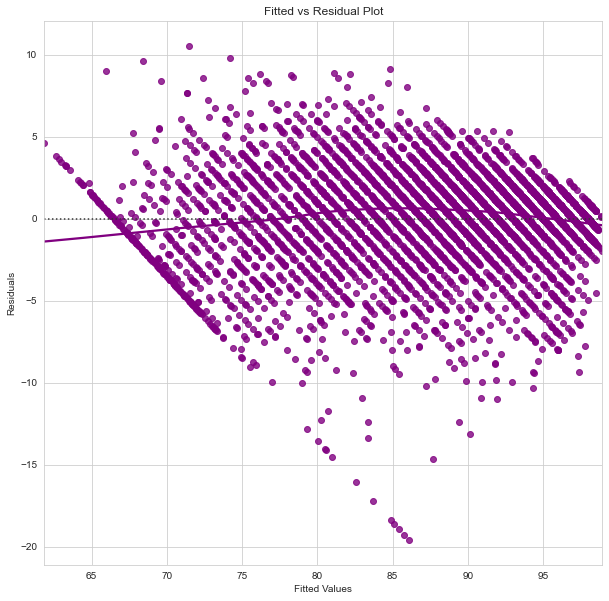

In [1773]:
plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
sns.residplot(data=df_pred,x='Fitted Values',y= 'Residuals',color = 'purple', lowess = True )
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Fitted vs Residual Plot')
plt.show()

In [1774]:
df4=df_with_drop_outlier_treated.drop(['vflt','pgin','fork','sread','freeswap'],axis=1)

<AxesSubplot:xlabel='Residuals', ylabel='Count'>

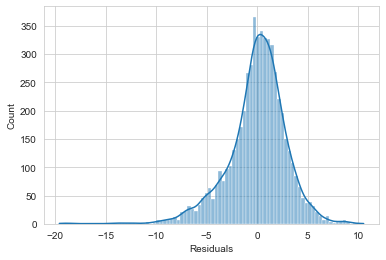

In [1775]:
sns.histplot(df_pred["Residuals"],kde=True)

<function matplotlib.pyplot.show(close=None, block=None)>

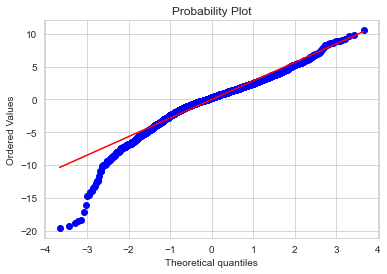

In [1776]:
import pylab
import scipy.stats as stats
stats.probplot(df_pred["Residuals"],dist = "norm",plot=pylab)
plt.show

In [1777]:
stats.shapiro(df_pred["Residuals"])

C:\Users\Renjith KP\anaconda3\lib\site-packages\scipy\stats\morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9551745057106018, pvalue=3.271442528064353e-38)

In [1778]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [1779]:
test = sms.het_goldfeldquandt(df_pred["Residuals"],X_train)
lzip(test)

[(1.0537750023580505,), (0.08465372149938767,), ('increasing',)]

Since p value > 0.05 , we could say residuals are homoscedastic

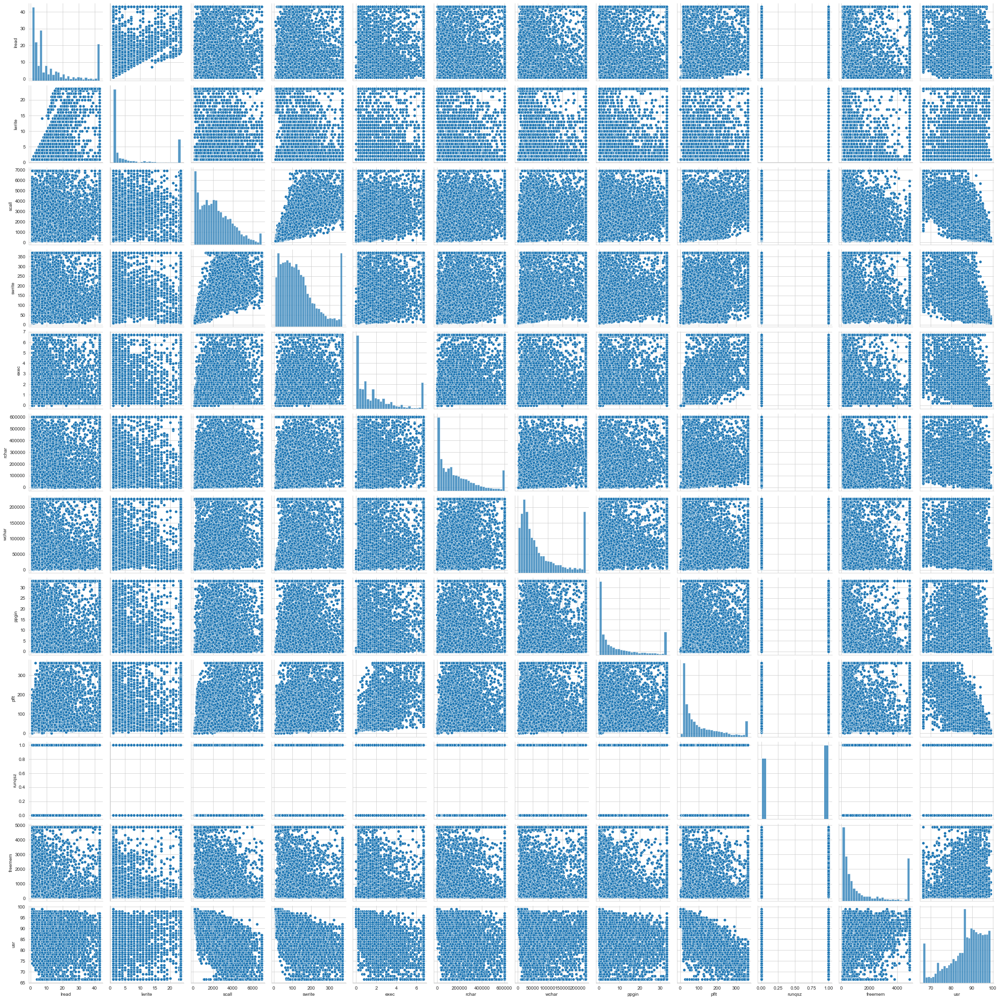

In [1780]:
sns.pairplot(df4)


2.1 Data Ingestion: Read the dataset. Do the descriptive statistics and do null value condition check, check for duplicates and outliers and write an inference on it. Perform Univariate and Bivariate Analysis and Multivariate Analysis.Data Description


In [1781]:
data = pd.read_csv(r"C:\Users\Renjith KP\Downloads\Contraceptive_method_dataset.csv")

In [1782]:
data.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [1783]:
data.tail()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,Yes


In [1784]:
data.shape

(1473, 10)

In [1785]:
data.dtypes

Wife_age                     float64
Wife_ education               object
Husband_education             object
No_of_children_born          float64
Wife_religion                 object
Wife_Working                  object
Husband_Occupation             int64
Standard_of_living_index      object
Media_exposure                object
Contraceptive_method_used     object
dtype: object

In [1786]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
No_of_children_born,1452.0,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Husband_Occupation,1473.0,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0


In [1787]:
data.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [1788]:
# Check for duplicate data
dups = data.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
data[dups]

Number of duplicate rows = 80


,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
79,38.0,Tertiary,Tertiary,1.0,Scientology,Yes,1,Very High,Exposed,No
167,26.0,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
224,47.0,Tertiary,Tertiary,4.0,Scientology,No,1,Very High,Exposed,No
270,30.0,Tertiary,Tertiary,2.0,Scientology,No,1,Very High,Exposed,No
299,26.0,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1367,44.0,Tertiary,Tertiary,5.0,Scientology,Yes,1,Very High,Exposed,Yes
1387,NaN,Secondary,Tertiary,2.0,Scientology,Yes,2,Very High,Exposed,Yes
1423,NaN,Tertiary,Tertiary,2.0,Non-Scientology,No,1,Very High,Exposed,Yes
1440,NaN,Tertiary,Tertiary,1.0,Non-Scientology,Yes,2,Very High,Exposed,Yes


In [1789]:
data.drop_duplicates(inplace=True)

In [1790]:
data.duplicated().sum()

0

<AxesSubplot:xlabel='Contraceptive_method_used', ylabel='count'>

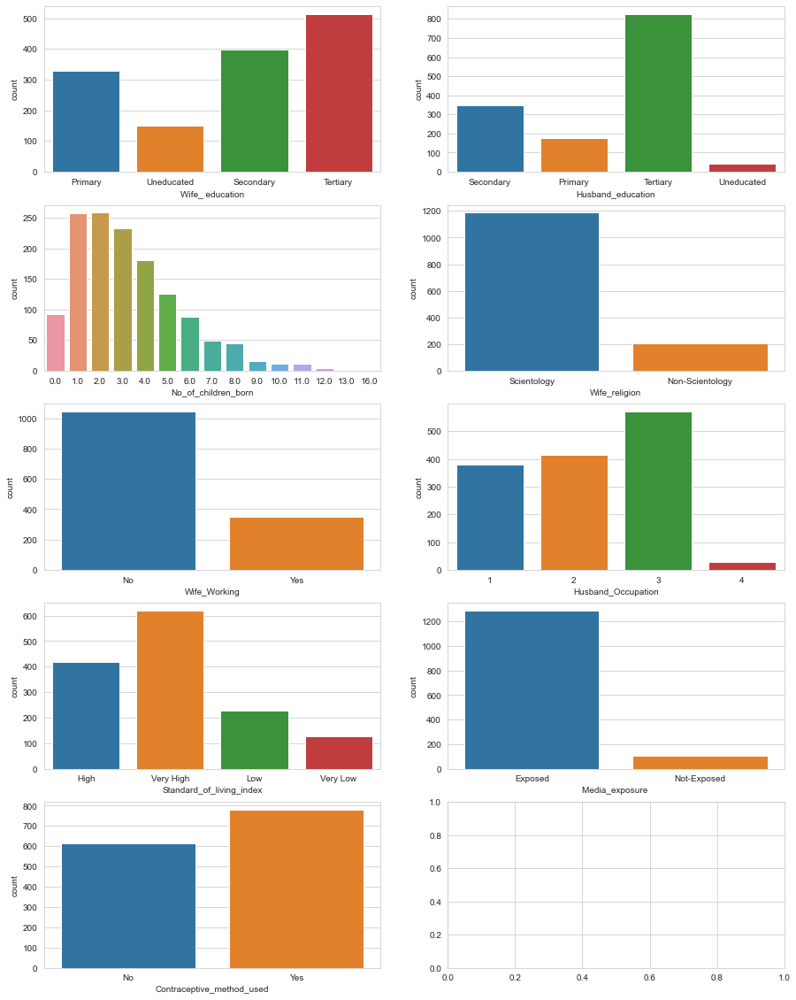

In [1791]:
fig, axes=plt.subplots(nrows=5,ncols=2)
fig.set_size_inches(15,20)
sns.countplot(data=data,x=data['Wife_ education'],ax=axes[0][0])
sns.countplot(data=data,x=data['Husband_education'],ax=axes[0][1])
sns.countplot(data=data,x=data['No_of_children_born'],ax=axes[1][0])
sns.countplot(data=data,x=data['Wife_religion'],ax=axes[1][1])
sns.countplot(data=data,x=data['Wife_Working'],ax=axes[2][0])
sns.countplot(data=data,x=data['Husband_Occupation'],ax=axes[2][1])
sns.countplot(data=data,x=data['Standard_of_living_index'],ax=axes[3][0])
sns.countplot(data=data,x=data['Media_exposure '],ax=axes[3][1])
sns.countplot(data=data,x=data['Contraceptive_method_used'],ax=axes[4][0])

<AxesSubplot:xlabel='Wife_age'>

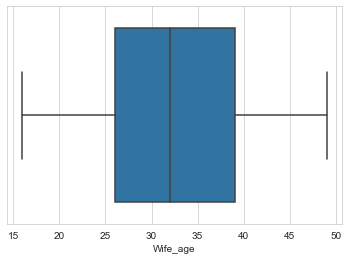

In [1792]:
sns.boxplot(data=data,x=data['Wife_age'])

<AxesSubplot:xlabel='Wife_age', ylabel='Count'>

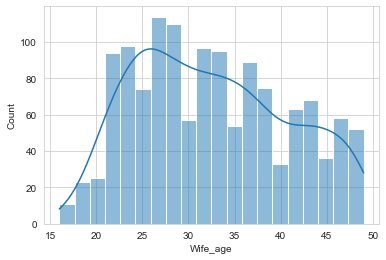

In [1793]:
sns.histplot(data=data,x=data['Wife_age'],bins=20,kde=True)

<AxesSubplot:xlabel='Media_exposure ', ylabel='count'>

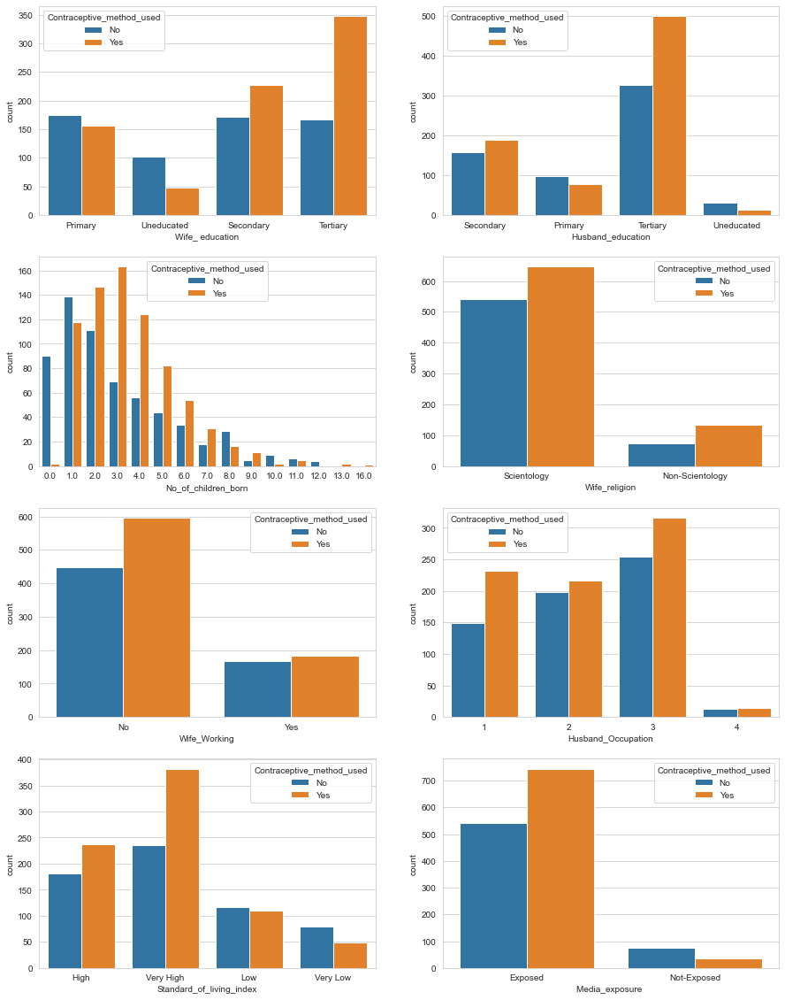

In [1794]:
fig, axes=plt.subplots(nrows=4,ncols=2)
fig.set_size_inches(15,20)
sns.countplot(data=data,x=data['Wife_ education'],hue='Contraceptive_method_used',ax=axes[0][0])
sns.countplot(data=data,x=data['Husband_education'],hue='Contraceptive_method_used',ax=axes[0][1])
sns.countplot(data=data,x=data['No_of_children_born'],hue='Contraceptive_method_used',ax=axes[1][0])
sns.countplot(data=data,x=data['Wife_religion'],hue='Contraceptive_method_used',ax=axes[1][1])
sns.countplot(data=data,x=data['Wife_Working'],hue='Contraceptive_method_used',ax=axes[2][0])
sns.countplot(data=data,x=data['Husband_Occupation'],hue='Contraceptive_method_used',ax=axes[2][1])
sns.countplot(data=data,x=data['Standard_of_living_index'],hue='Contraceptive_method_used',ax=axes[3][0])
sns.countplot(data=data,x=data['Media_exposure '],hue='Contraceptive_method_used',ax=axes[3][1])

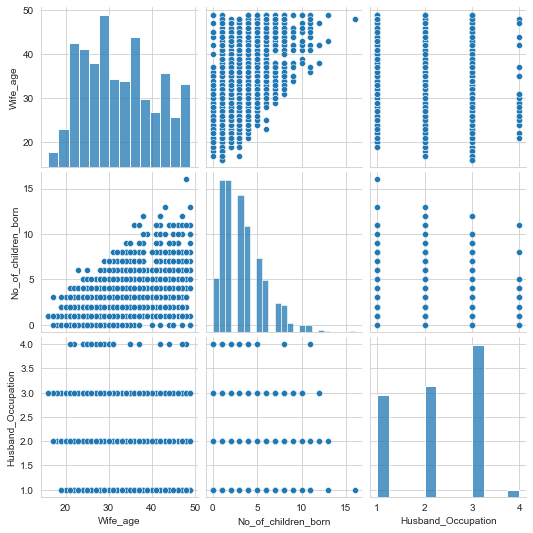

In [1795]:
sns.pairplot(data)

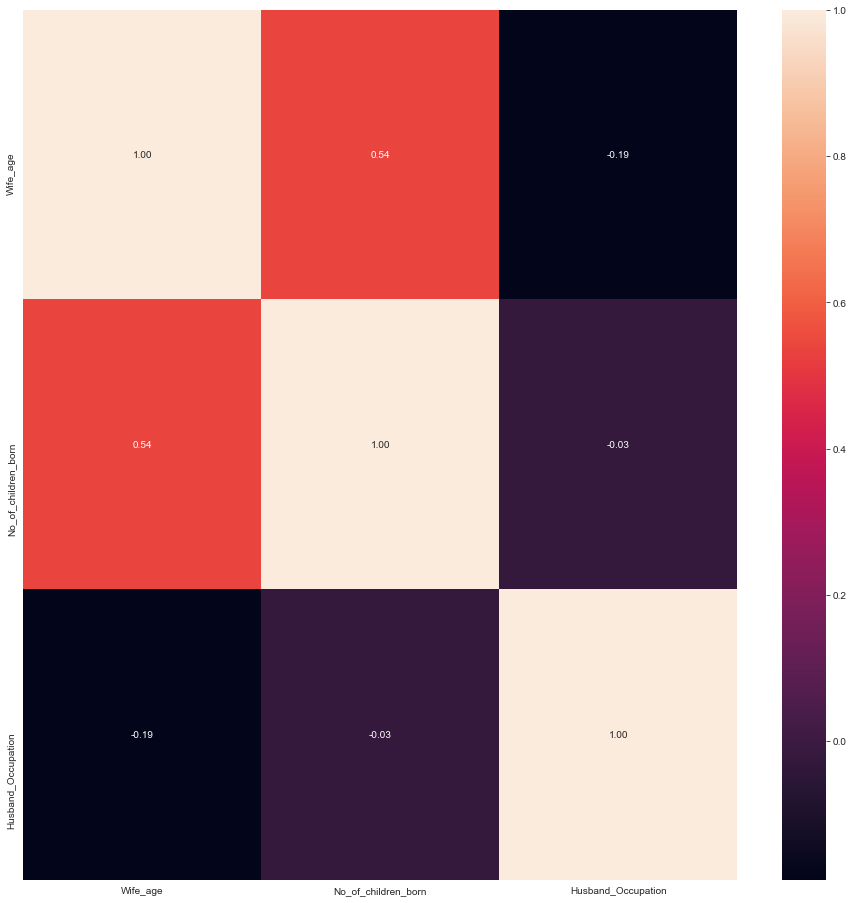

In [1796]:
plt.figure(figsize=(16,16))
sns.heatmap(data.corr(),annot=True,fmt=".2f");

In [1797]:
data.isnull().sum()

Wife_age                     67
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [1798]:
data[['Wife_age', 'No_of_children_born']] = data[['Wife_age', 'No_of_children_born']].fillna(data[['Wife_age', 'No_of_children_born']].median())

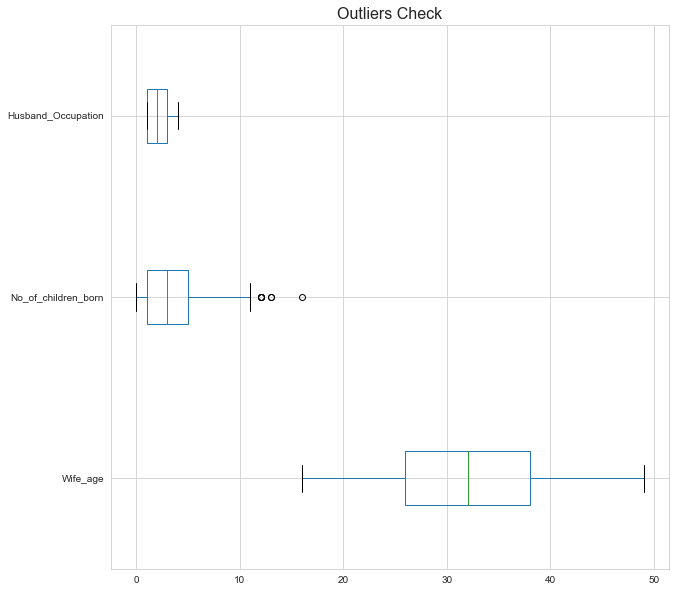

In [1799]:
# construct box plot for continuous variables
cont=data.dtypes[(data.dtypes!='ufloat64') & (data.dtypes!='uint64') ].index
plt.figure(figsize=(10,10))
data[cont].boxplot(vert=0)
plt.title('Outliers Check',fontsize=16)
plt.show()

In [1800]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [1801]:
lr,ur=remove_outlier(data['No_of_children_born'])
data['No_of_children_born']=np.where(data['No_of_children_born']>ur,ur,data['No_of_children_born'])
data['No_of_children_born']=np.where(data['No_of_children_born']<lr,lr,data['No_of_children_born'])

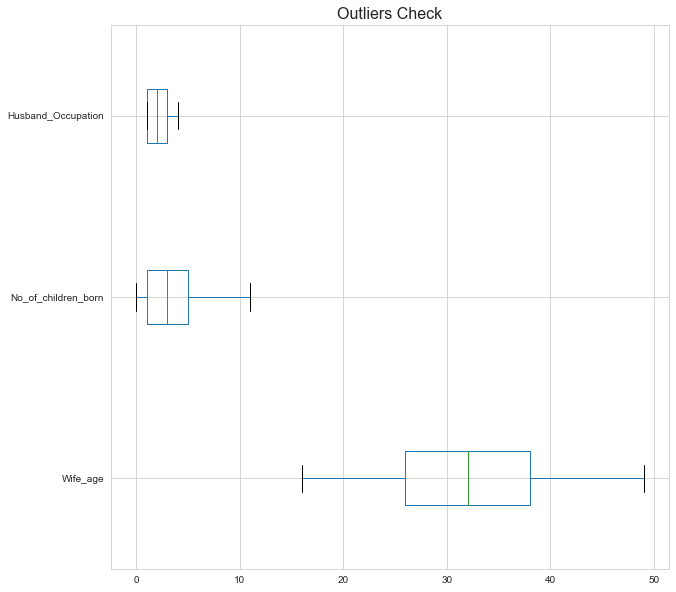

In [1802]:
# construct box plot for continuous variables
cont=data.dtypes[(data.dtypes!='ufloat64') & (data.dtypes!='uint64') ].index
plt.figure(figsize=(10,10))
data[cont].boxplot(vert=0)
plt.title('Outliers Check',fontsize=16)
plt.show()

In [1803]:
data1 = data[data['Wife_age'] >= 18]

In [1804]:
data1.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1382.0,32.656295,7.995824,18.0,26.0,32.0,38.0,49.0
No_of_children_born,1382.0,3.294501,2.346078,0.0,2.0,3.0,5.0,11.0
Husband_Occupation,1382.0,2.170043,0.855633,1.0,1.0,2.0,3.0,4.0


In [1805]:
data = copy.deepcopy(data1)

2.2 Do not scale the data. Encode the data (having string values) for Modelling. Data Split: Split the data into train and test (70:30). Apply Logistic Regression and LDA (linear discriminant analysis) and CART.

2.3 Performance Metrics: Check the performance of Predictions on Train and Test sets using Accuracy, Confusion Matrix, Plot ROC curve and get ROC_AUC score for each model Final Model: Compare Both the models and write inference which model is best/optimized. 

In [1806]:
data['Wife_ education']=np.where(data['Wife_ education'] =='Uneducated', '0', data['Wife_ education'])
data['Wife_ education']=np.where(data['Wife_ education'] =='Primary', '1', data['Wife_ education'])
data['Wife_ education']=np.where(data['Wife_ education'] =='Secondary', '2', data['Wife_ education'])
data['Wife_ education']=np.where(data['Wife_ education'] =='Tertiary', '3', data['Wife_ education'])

In [1807]:
data['Husband_education']=np.where(data['Husband_education'] =='Uneducated', '0', data['Husband_education'])
data['Husband_education']=np.where(data['Husband_education'] =='Primary', '1', data['Husband_education'])
data['Husband_education']=np.where(data['Husband_education'] =='Secondary', '2', data['Husband_education'])
data['Husband_education']=np.where(data['Husband_education'] =='Tertiary', '3', data['Husband_education'])

In [1808]:
data['Standard_of_living_index']=np.where(data['Standard_of_living_index'] =='Very Low', '0', data['Standard_of_living_index'])
data['Standard_of_living_index']=np.where(data['Standard_of_living_index'] =='Low', '1', data['Standard_of_living_index'])
data['Standard_of_living_index']=np.where(data['Standard_of_living_index'] =='High', '2', data['Standard_of_living_index'])
data['Standard_of_living_index']=np.where(data['Standard_of_living_index'] =='Very High', '3', data['Standard_of_living_index'])

In [1809]:
data['Contraceptive_method_used']=np.where(data['Contraceptive_method_used'] =='Yes', '1', data['Contraceptive_method_used'])
data['Contraceptive_method_used']=np.where(data['Contraceptive_method_used'] =='No', '0', data['Contraceptive_method_used'])

In [1810]:
data['Wife_ education'] = data['Wife_ education'].astype('int64')
data['Husband_education'] = data['Husband_education'].astype('int64')
data['Standard_of_living_index'] = data['Standard_of_living_index'].astype('int64')
data['Contraceptive_method_used'] = data['Contraceptive_method_used'].astype('int64')

In [1811]:
data.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,1,2,3.0,Scientology,No,2,2,Exposed,0
1,45.0,0,2,10.0,Scientology,No,3,3,Exposed,0
2,43.0,1,2,7.0,Scientology,No,3,3,Exposed,0
3,42.0,2,1,9.0,Scientology,No,3,2,Exposed,0
4,36.0,2,2,8.0,Scientology,No,3,1,Exposed,0


In [1812]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1382 entries, 0 to 1471
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1382 non-null   float64
 1   Wife_ education            1382 non-null   int64  
 2   Husband_education          1382 non-null   int64  
 3   No_of_children_born        1382 non-null   float64
 4   Wife_religion              1382 non-null   object 
 5   Wife_Working               1382 non-null   object 
 6   Husband_Occupation         1382 non-null   int64  
 7   Standard_of_living_index   1382 non-null   int64  
 8   Media_exposure             1382 non-null   object 
 9   Contraceptive_method_used  1382 non-null   int64  
dtypes: float64(2), int64(5), object(3)
memory usage: 118.8+ KB


In [1813]:
## Converting the other 'object' type variables as dummy variables

data_dummy = pd.get_dummies(data,drop_first=True)
data_dummy.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Husband_Occupation,Standard_of_living_index,Contraceptive_method_used,Wife_religion_Scientology,Wife_Working_Yes,Media_exposure _Not-Exposed
0,24.0,1,2,3.0,2,2,0,1,0,0
1,45.0,0,2,10.0,3,3,0,1,0,0
2,43.0,1,2,7.0,3,3,0,1,0,0
3,42.0,2,1,9.0,3,2,0,1,0,0
4,36.0,2,2,8.0,3,1,0,1,0,0


In [1814]:
data_dummy['Contraceptive_method_used'].value_counts(normalize=True)

1    0.558611
0    0.441389
Name: Contraceptive_method_used, dtype: float64

In [1815]:
data_dummy['Contraceptive_method_used'].value_counts()

1    772
0    610
Name: Contraceptive_method_used, dtype: int64

Logistic Regression

In [1816]:
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,plot_confusion_matrix

In [1817]:
X = data_dummy.drop('Contraceptive_method_used', axis=1)
y = data_dummy['Contraceptive_method_used']

In [1818]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=1,stratify=data_dummy['Contraceptive_method_used'])

In [1819]:
print('Number of rows and columns of the training set for the independent variables:',X_train.shape)
print('Number of rows and columns of the training set for the dependent variable:',y_train.shape)
print('Number of rows and columns of the test set for the independent variables:',X_test.shape)
print('Number of rows and columns of the test set for the dependent variable:',y_test.shape)

Number of rows and columns of the training set for the independent variables: (967, 9)
Number of rows and columns of the training set for the dependent variable: (967,)
Number of rows and columns of the test set for the independent variables: (415, 9)
Number of rows and columns of the test set for the dependent variable: (415,)


In [1820]:
# Fit the Logistic Regression model
model = LogisticRegression(solver='newton-cg',max_iter=10000,penalty='none',verbose=True,n_jobs=2)
model.fit(X_train, y_train)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    2.3s finished


LogisticRegression(max_iter=10000, n_jobs=2, penalty='none', solver='newton-cg',
                   verbose=True)

In [1821]:
ytrain_predict = model.predict(X_train)
ytest_predict = model.predict(X_test)

In [1822]:
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.330491,0.669509
1,0.380162,0.619838
2,0.486145,0.513855
3,0.669376,0.330624
4,0.511951,0.488049


In [1823]:
ytrain_predict_prob=model.predict_proba(X_train)

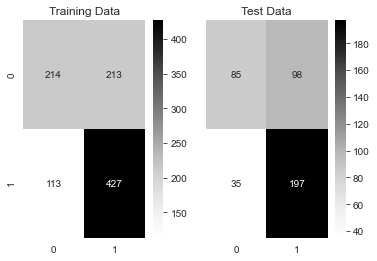

In [1824]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_predict)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][0]);
a[0][0].set_title('Training Data')

plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_predict)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][1]);
a[0][1].set_title('Test Data');

In [1825]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train,ytrain_predict),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test,ytest_predict),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.65      0.50      0.57       427
           1       0.67      0.79      0.72       540

    accuracy                           0.66       967
   macro avg       0.66      0.65      0.65       967
weighted avg       0.66      0.66      0.65       967
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.71      0.46      0.56       183
           1       0.67      0.85      0.75       232

    accuracy                           0.68       415
   macro avg       0.69      0.66      0.65       415
weighted avg       0.69      0.68      0.67       415
 



AUC for the Training Data: 0.701
AUC for the Test Data: 0.714


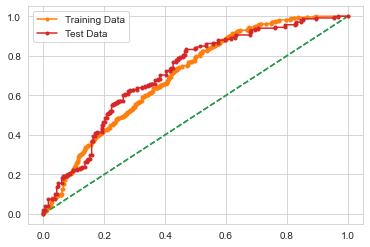

In [1826]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(y_train,ytrain_predict_prob[:,1])
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,ytrain_predict_prob[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(y_test,ytest_predict_prob[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,ytest_predict_prob[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

In [1827]:
# Accuracy - Test Data
model.score(X_test, y_test)

0.6795180722891566

In [1828]:
# Accuracy - Training Data
model.score(X_train, y_train)

0.6628748707342296

LDA

In [1829]:
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix
from sklearn import metrics,model_selection

In [1830]:
X = data_dummy.drop('Contraceptive_method_used', axis=1)
y = data_dummy['Contraceptive_method_used']

In [1831]:
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(X, y, test_size=0.30 , random_state=1,stratify=data_dummy['Contraceptive_method_used'])

In [1832]:
print('Number of rows and columns of the training set for the independent variables:',X_train1.shape)
print('Number of rows and columns of the training set for the dependent variable:',Y_train1.shape)
print('Number of rows and columns of the test set for the independent variables:',X_test1.shape)
print('Number of rows and columns of the test set for the dependent variable:',Y_test1.shape)

Number of rows and columns of the training set for the independent variables: (967, 9)
Number of rows and columns of the training set for the dependent variable: (967,)
Number of rows and columns of the test set for the independent variables: (415, 9)
Number of rows and columns of the test set for the dependent variable: (415,)


In [1833]:
clf = LinearDiscriminantAnalysis()
model1=clf.fit(X_train1,Y_train1)

In [1834]:
#intercept value
clf.intercept_ 

array([0.34642245])

In [1835]:
#coefficients for the Linear Discriminant Function
clf.coef_

array([[-0.076877  ,  0.3882185 ,  0.08522346,  0.32079666,  0.1729551 ,
         0.26520079, -0.5021115 , -0.03151191, -0.58656833]])

In [1836]:
X_train1.columns

Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Husband_Occupation', 'Standard_of_living_index',
       'Wife_religion_Scientology', 'Wife_Working_Yes',
       'Media_exposure _Not-Exposed'],
      dtype='object')

In [1837]:
a=clf.coef_
np.round(a,2) # rounded up coefficients 

array([[-0.08,  0.39,  0.09,  0.32,  0.17,  0.27, -0.5 , -0.03, -0.59]])

In [1838]:
# Training Data Class Prediction with a cut-off value of 0.5
pred_class_train = model1.predict(X_train1)
# Test Data Class Prediction with a cut-off value of 0.5
pred_class_test = model1.predict(X_test1)

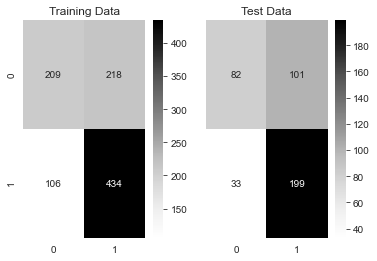

In [1839]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(Y_train1,pred_class_train)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][0]);
a[0][0].set_title('Training Data')

plot_1 = sns.heatmap((metrics.confusion_matrix(Y_test1,pred_class_test)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][1]);
a[0][1].set_title('Test Data');

In [1840]:
print('Classification Report of the training data:\n\n',metrics.classification_report(Y_train1,pred_class_train),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(Y_test1,pred_class_test),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.66      0.49      0.56       427
           1       0.67      0.80      0.73       540

    accuracy                           0.66       967
   macro avg       0.66      0.65      0.65       967
weighted avg       0.66      0.66      0.66       967
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.71      0.45      0.55       183
           1       0.66      0.86      0.75       232

    accuracy                           0.68       415
   macro avg       0.69      0.65      0.65       415
weighted avg       0.69      0.68      0.66       415
 



In [1841]:
# Training Data Probability Prediction
pred_prob_train = model.predict_proba(X_train1)

# Test Data Probability Prediction
pred_prob_test = model.predict_proba(X_test1)

AUC for the Training Data: 0.701
AUC for the Test Data: 0.714


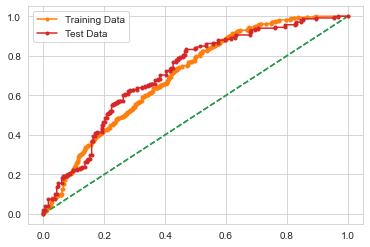

In [1842]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(Y_train1,pred_prob_train[:,1])
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_train1,pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(Y_test1,pred_prob_test[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test1,pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

In [1843]:
model1.score(X_train1,Y_train1)

0.6649431230610134

In [1844]:
model1.score(X_test1,Y_test1)

0.6771084337349398

CART

In [1845]:
from sklearn.tree import DecisionTreeClassifier

In [1846]:
X = data_dummy.drop(['Contraceptive_method_used'],axis=1)
Y = data_dummy['Contraceptive_method_used']

In [1847]:
X_train, X_test, train_labels, test_labels = train_test_split(X, Y, test_size=.30, random_state=1)

In [1848]:
dt_model = DecisionTreeClassifier(criterion = 'gini' )

In [1849]:
dt_model.fit(X_train, train_labels)

DecisionTreeClassifier()

In [1850]:
from sklearn import tree

train_char_label = ['No', 'Yes']
Credit_Tree_File = open('d:\credit_tree.dot','w')
dot_data = tree.export_graphviz(dt_model, out_file=Credit_Tree_File, feature_names = list(X_train), class_names = list(train_char_label))

Credit_Tree_File.close()

In [1851]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                                  Imp
Wife_age                     0.289913
Wife_ education              0.102738
Husband_education            0.076912
No_of_children_born          0.258997
Husband_Occupation           0.081211
Standard_of_living_index     0.081592
Wife_religion_Scientology    0.042581
Wife_Working_Yes             0.051119
Media_exposure _Not-Exposed  0.014937


In [1852]:
y_predict = dt_model.predict(X_test)

In [1853]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 7,min_samples_leaf=10,min_samples_split=30)
reg_dt_model.fit(X_train, train_labels)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=10, min_samples_split=30)

In [1854]:
credit_tree_regularized = open('d:\credit_tree_regularized.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= credit_tree_regularized , feature_names = list(X_train), class_names = list(train_char_label))

credit_tree_regularized.close()

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                                  Imp
Wife_age                     0.289913
Wife_ education              0.102738
Husband_education            0.076912
No_of_children_born          0.258997
Husband_Occupation           0.081211
Standard_of_living_index     0.081592
Wife_religion_Scientology    0.042581
Wife_Working_Yes             0.051119
Media_exposure _Not-Exposed  0.014937


In [1855]:
ytrain_predict = reg_dt_model.predict(X_train)
ytest_predict = reg_dt_model.predict(X_test)

In [1856]:
import matplotlib.pyplot as plt

In [1857]:
probs_train = reg_dt_model.predict_proba(X_train)
probs_test = reg_dt_model.predict_proba(X_test)


AUC for the Training Data: 0.831
AUC for the Test Data: 0.733


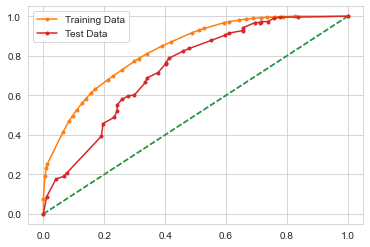

In [1858]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(train_labels,probs_train[:,1])
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(train_labels,probs_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(test_labels,probs_test[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(test_labels,probs_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

In [1859]:
print('Classification Report of the training data:\n\n',metrics.classification_report(train_labels, ytrain_predict),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(test_labels, ytest_predict),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.75      0.61      0.67       416
           1       0.74      0.85      0.79       551

    accuracy                           0.75       967
   macro avg       0.75      0.73      0.73       967
weighted avg       0.75      0.75      0.74       967
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.73      0.54      0.62       194
           1       0.67      0.82      0.74       221

    accuracy                           0.69       415
   macro avg       0.70      0.68      0.68       415
weighted avg       0.70      0.69      0.68       415
 



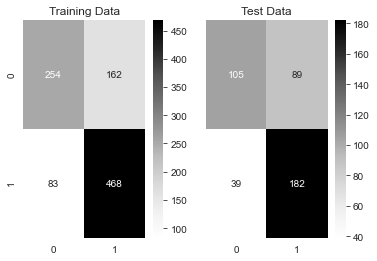

In [1860]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(train_labels, ytrain_predict)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][0]);
a[0][0].set_title('Training Data')

plot_1 = sns.heatmap((metrics.confusion_matrix(test_labels, ytest_predict)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][1]);
a[0][1].set_title('Test Data');

In [1861]:
reg_dt_model.score(X_train,train_labels)

0.7466390899689762

In [1862]:
reg_dt_model.score(X_test,test_labels)

0.691566265060241